In [2]:
# from utilities.utilitiesPlusPlus_v1 import *
from utilities.histUtilities import *
import joblib
from scipy import stats
import pandas as pd
from matplotlib.colors import ListedColormap
from MLtools.xgb_plusplus import *
# from utilities.utilitiesPlusPlus_v1 import *
from utilities.histUtilities import *
from utilities.kde import *
from glob import glob
from matplotlib import pyplot
from numpy.random import normal
from sklearn.neighbors import KernelDensity
import scipy.stats as st

/Users/spencerhirsch/opt/anaconda3/envs/my_root_env/lib/python3.10/site-packages/xgboost/compat.py:93: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


# Scale Factor Calculation

In [3]:
scale_factors_sig = {
"MZD_200_55" : (2.04E+02 * 1.454E-02 * 59.9)/30000,
"MZD_350_30" : (3.01E+01 * 1.200E-02 * 59.9)/30000,
"MZD_200_30" : (2.04E+02 * 1.454E-02 * 59.9)/30000,
"MZD_350_55" : (3.01E+01 * 1.200E-02 * 59.9)/30000,
"MZD_400_15" : (1.89E+01 * 1.200E-02 * 59.9)/30000,
"MZD_190_55" : 1,
"MZD_250_55" : (9.43E+01 * 1.200E-02 * 59.9)/30000,
"MZD_180_30" : (2.95E+02 * 1.441E-02 * 59.9)/30000,
"MZD_300_30" : (5.12E+01 * 1.200E-02 * 59.9)/30000,
"MZD_250_30" : (9.43E+01 * 1.200E-02 * 59.9)/30000,
"MZD_190_30" : 1,
"MZD_300_55" : (3.01E+01 * 1.200E-02 * 59.9)/30000,
"MZD_180_55" : (2.95E+02 * 1.133E-02 * 59.9)/30000,
"MZD_190_15" : 1,
"MZD_95_25"  : 1, # 10000
"MZD_250_15" : (1.02E+03 * 1.200E-02 * 59.9)/30000,
"MZD_85_25"  : 1,
"MZD_300_15" : (5.12E+01 * 1.200E-02 * 59.9)/30000,
"MZD_180_15" : (2.95E+02 * 1.651E-02 * 59.9)/30000,
"MZD_400_55" : (1.89E+01 * 1.200E-02 * 59.9)/30000,
"MZD_95_15"  : 1, # 10000
"MZD_85_15"  : 1,
"MZD_400_30" : (1.89E+01 * 1.200E-02 * 59.9)/30000,
"MZD_200_15" : 1,
"MZD_350_15" : (3.01E+01 * 1.200E-02 * 59.9)/30000,
"MZD_160_15" : 1,
"MZD_170_15" : (3.62E+02 * 1.649E-02 * 59.9)/30000,
"MZD_150_15" : (5.71E+02 * 1.644E-02 * 57.9)/30000,
"MZD_85_35"  : 1,
"MZD_125_15" : (1.23E+03 * 3.259E-02 * 59.9)/30000,
"MZD_150_55" : (5.71E+02 * 9.33E-03  * 59.9)/30000,
"MZD_125_30" : (1.23E+03 * 1.354E-02 * 59.9)/30000,
"MZD_150_30" : (5.71E+02 * 1.407E-02 * 57.9)/30000,
"MZD_125_55" : (1.23E+03 * 4.960E-03 * 59.9)/30000,
"MZD_160_55" : 1,
"MZD_95_45"  : (2.39E+04 * 2.012E-03 * 59.9)/10000,
"MZD_170_30" : 1,
"MZD_160_30" : 1,
"MZD_170_55" : (3.62E+02 * 1.085E-02 * 59.9)/30000
}

scale_factors_sig_temp =  scale_factors_sig

missing_sf = [key for key in scale_factors_sig_temp.keys() if scale_factors_sig_temp[key] == 1]

print(missing_sf)

missing_sf_br = { # From FD_Model_SCANS.xlsx
    'MZD_190_55': 1.171E-02,
    'MZD_190_30': 1.448E-02,
    'MZD_190_15': 1.653E-02,
    'MZD_95_25' : 1.338E-02,
    'MZD_85_25' : 1.274E-02,
    'MZD_95_15' : 1.603E-02,
    'MZD_85_15' : 1.588E-02,
    'MZD_200_15': 1.654E-02,
    'MZD_160_15': 1.647E-02,
    'MZD_85_35' : 7.433E-03,
    'MZD_160_55': 1.022E-02,
    'MZD_170_30': 1.432E-02,
    'MZD_160_30': 1.421E-02
}

missing_sf_xsec = { # From FD_Model_SCANS.xlsx
    'MZD_190_55': 2.44E+02, #
    'MZD_190_30': 2.44E+02, #
    'MZD_190_15': 2.44E+02, #
    'MZD_95_25' : 2.39E+04, #
    'MZD_85_25' : 1.45E+03, #
    'MZD_95_15' : 2.39E+04, #
    'MZD_85_15' : 1.45E+03, #
    'MZD_200_15': 2.04E+02, #
    'MZD_160_15': 4.48E+02, #
    'MZD_85_35' : 1.45E+03, #
    'MZD_160_55': 4.48E+02, #
    'MZD_170_30': 3.62E+02, #
    'MZD_160_30': 4.48E+02  #
}

lumi   = 59.9
events = 30000 

for key in missing_sf:
    scale_factors_sig[key] = (missing_sf_br[key] * missing_sf_xsec[key] * lumi) / events

['MZD_190_55', 'MZD_190_30', 'MZD_190_15', 'MZD_95_25', 'MZD_85_25', 'MZD_95_15', 'MZD_85_15', 'MZD_200_15', 'MZD_160_15', 'MZD_85_35', 'MZD_160_55', 'MZD_170_30', 'MZD_160_30']


In [4]:
scale_factors_sig

{'MZD_200_55': 0.0059224328,
 'MZD_350_30': 0.000721196,
 'MZD_200_30': 0.0059224328,
 'MZD_350_55': 0.000721196,
 'MZD_400_15': 0.00045284399999999994,
 'MZD_190_55': 0.005704955866666667,
 'MZD_250_55': 0.002259428,
 'MZD_180_30': 0.008487730166666665,
 'MZD_300_30': 0.001226752,
 'MZD_250_30': 0.002259428,
 'MZD_190_30': 0.0070544629333333326,
 'MZD_300_55': 0.000721196,
 'MZD_180_55': 0.006673558833333334,
 'MZD_190_15': 0.0080531956,
 'MZD_95_25': 0.6384980599999999,
 'MZD_250_15': 0.0244392,
 'MZD_85_25': 0.03688442333333333,
 'MZD_300_15': 0.001226752,
 'MZD_180_15': 0.009724665166666667,
 'MZD_400_55': 0.00045284399999999994,
 'MZD_95_15': 0.7649569433333333,
 'MZD_85_15': 0.04597524666666666,
 'MZD_400_30': 0.00045284399999999994,
 'MZD_200_15': 0.0067370728,
 'MZD_350_15': 0.000721196,
 'MZD_160_15': 0.014732524799999999,
 'MZD_170_15': 0.011918862066666666,
 'MZD_150_15': 0.018117373200000002,
 'MZD_85_35': 0.021519773833333332,
 'MZD_125_15': 0.08003778100000002,
 'MZD_150_

In [15]:
hist_bkg = histogram("bkg")
all_bkg = hist_bkg.import_csv("single")
hist_bkg.import_correctPairs(all_bkg)
hist_bkg.create_hist()
#hist_bkg.plotHist()
hist_bkg.create_hist_2d()
#hist_bkg.plot2Dhist()

FileNotFoundError: [Errno 2] No such file or directory: 'dataframes/..DY0J/single_correct_pair_DY0J.csv'

In [5]:
file_name = "DataAboveUpsilonCRSR_sample_1.root"
base_dir = 'CF_signal/MZD_FD_CF'

root_file_list_sig = [path + file_name for path in glob(f'{base_dir}/*/')]
keys               = [root_file_list_sig[ii].split('/')[2] for ii in range(len(root_file_list_sig))]

In [7]:
root_dir    = "DataAboveUpsilonCRSR"
dRcut       = 0.05 
cut         = "all" # cut type ("all" applies cuts to every observable)
verboseBool = False
singlePair  = True

all_sig = {} # initialize dictionary
for key in keys:
    if singlePair:
        all_sig[key] = {"full": None, "single": None}
    else:
        all_sig[key] = None

for file in range(len(root_file_list_sig)):
    data = processData("sig") # declare data processing object
    data.extractData(root_file_list_sig[file], root_dir, verbose = verboseBool)
    data.prelimCuts(verbose = verboseBool)
    data.removeBadEvents("all", verbose = verboseBool)
    data.matchBkgMu(verbose = verboseBool)
    data.permutations()
    data.invMassCalc(verbose = verboseBool)
    data.dR_diMu(verbose = verboseBool)
    if singlePair:
        all_sig[keys[file]]["full"] = data.fillAndSort()
    else:
        all_sig[keys[file]] = data.fillAndSort()
    
    del data # clean up memory




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1934/1934 [00:00<00:00, 12898.59it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1934/1934 [00:00<00:00, 12725.42it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1581/1581 [00:00<00:00, 12480.67it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1581/1581 [00:00<00:00, 13315.73it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1136/1136 [00:00<00:00, 12106.34it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1136/1136 [00:00<00:00, 12952.49it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2414/2414 [00:00<00:00, 13360.78it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2414/2414 [00:00<00:00, 13483.33it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 8419.38it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 58/58 [00:00<00:00, 4597.97it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 599/599 [00:00<00:00, 9402.09it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 599/599 [00:00<00:00, 11503.50it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1658/1658 [00:00<00:00, 14259.41it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1658/1658 [00:00<00:00, 13066.44it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 388/388 [00:00<00:00, 8638.13it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 388/388 [00:00<00:00, 11545.21it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1441/1441 [00:00<00:00, 11698.13it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1441/1441 [00:00<00:00, 13189.92it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1161/1161 [00:00<00:00, 12731.51it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1161/1161 [00:00<00:00, 12827.29it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 364/364 [00:00<00:00, 8847.41it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 364/364 [00:00<00:00, 10231.31it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1964/1964 [00:00<00:00, 13172.70it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1964/1964 [00:00<00:00, 13532.90it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 542/542 [00:00<00:00, 10697.29it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 542/542 [00:00<00:00, 12477.02it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 8641.94it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 35/35 [00:00<00:00, 3424.32it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 6905.34it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 5096.36it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 7896.65it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:00<00:00, 4497.11it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 5227.63it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:00<00:00, 2090.18it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 8918.63it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 4637.11it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 7257.24it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 38/38 [00:00<00:00, 4369.19it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2595/2595 [00:00<00:00, 13830.87it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2595/2595 [00:00<00:00, 13870.57it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 8568.55it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:00<00:00, 4561.51it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]
0it [00:00, ?it/s]





************************************************************
Filling final array
************************************************************


0it [00:00, ?it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1776/1776 [00:00<00:00, 12780.10it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1776/1776 [00:00<00:00, 12993.37it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [00:00<00:00, 8512.52it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 97/97 [00:00<00:00, 6114.15it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 9311.81it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:00<00:00, 5595.48it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 9864.53it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21/21 [00:00<00:00, 3878.83it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 94/94 [00:00<00:00, 7870.18it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 94/94 [00:00<00:00, 3897.17it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 98/98 [00:00<00:00, 8950.48it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 98/98 [00:00<00:00, 4076.54it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 8158.80it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 12/12 [00:00<00:00, 2620.21it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 7900.53it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:00<00:00, 2561.15it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1051/1051 [00:00<00:00, 11638.60it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1051/1051 [00:00<00:00, 12607.97it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [00:00<00:00, 7986.91it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 102/102 [00:00<00:00, 4664.56it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 682/682 [00:00<00:00, 9826.98it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 682/682 [00:00<00:00, 11608.29it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 174/174 [00:00<00:00, 8433.98it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 174/174 [00:00<00:00, 6506.33it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 440/440 [00:00<00:00, 9141.49it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 440/440 [00:00<00:00, 11642.69it/s]




************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************





Renaming sel mu arrays


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 8779.53it/s]





************************************************************
Filling final array
************************************************************


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 19/19 [00:00<00:00, 4187.69it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 921/921 [00:00<00:00, 11463.93it/s]





************************************************************
Filling final array
************************************************************


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 921/921 [00:00<00:00, 12650.45it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 224/224 [00:00<00:00, 8736.43it/s]





************************************************************
Filling final array
************************************************************


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 224/224 [00:00<00:00, 7261.80it/s]





************************************************************
Extracting data from DataAboveUpsilonCRSR_sample_1.root
************************************************************



Renaming sel mu arrays


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1439/1439 [00:00<00:00, 13017.22it/s]





************************************************************
Filling final array
************************************************************


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1439/1439 [00:00<00:00, 12938.08it/s]





************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determin

/Volumes/Memorex USB/FD_Model_ML/MLtools/xgb_plusplus.py:319: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (20, 10))





************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determin




************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determining correct and wrong pairs for the MZD_170_55 dataset
************************************************************



************************************************************
Loading trained XGBoost model from MZD_200_55_pd_model.sav
************************************************************



************************************************************
Determin

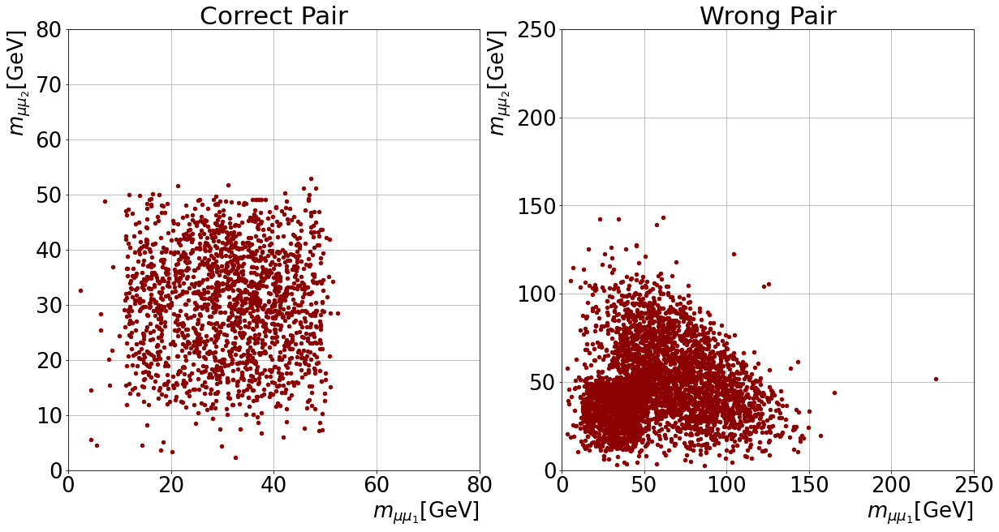

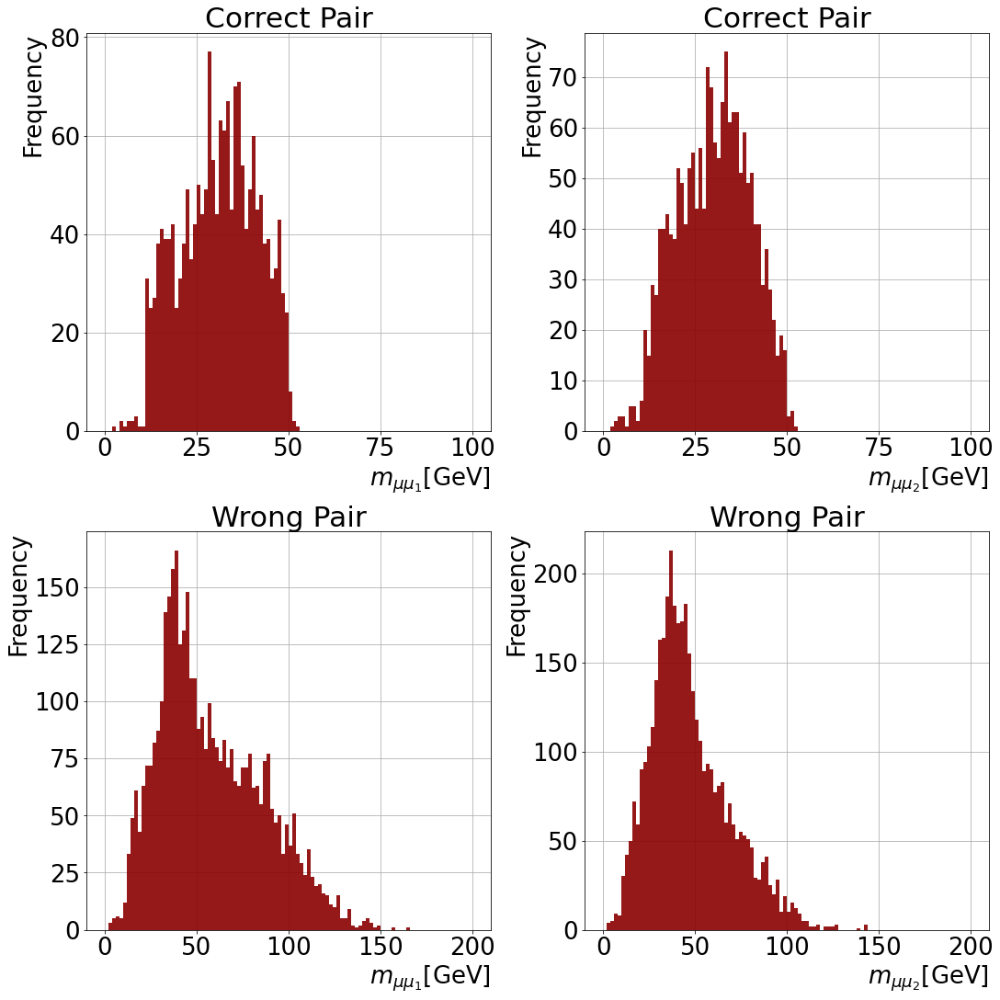

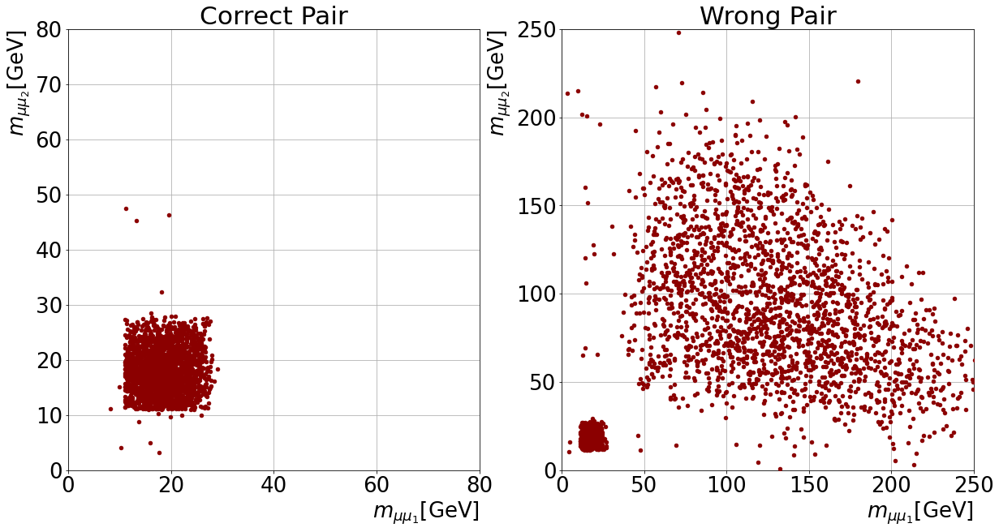

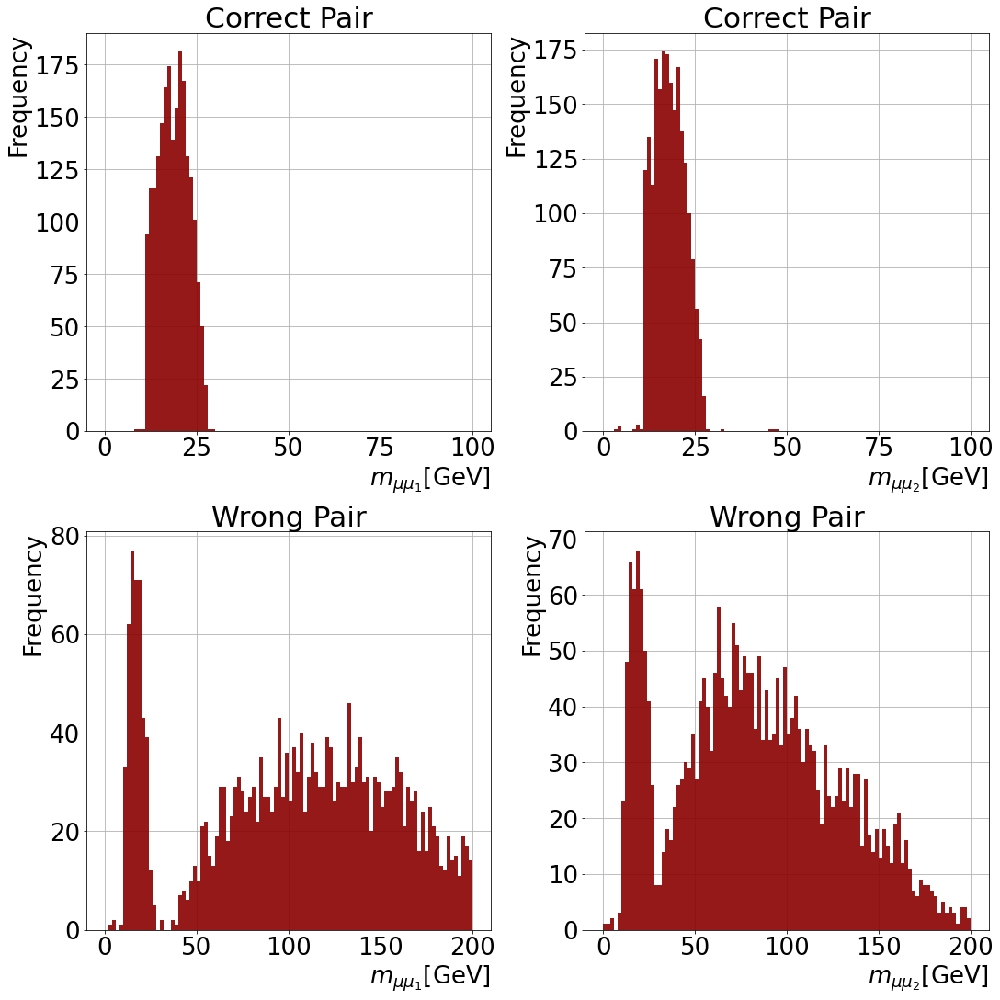

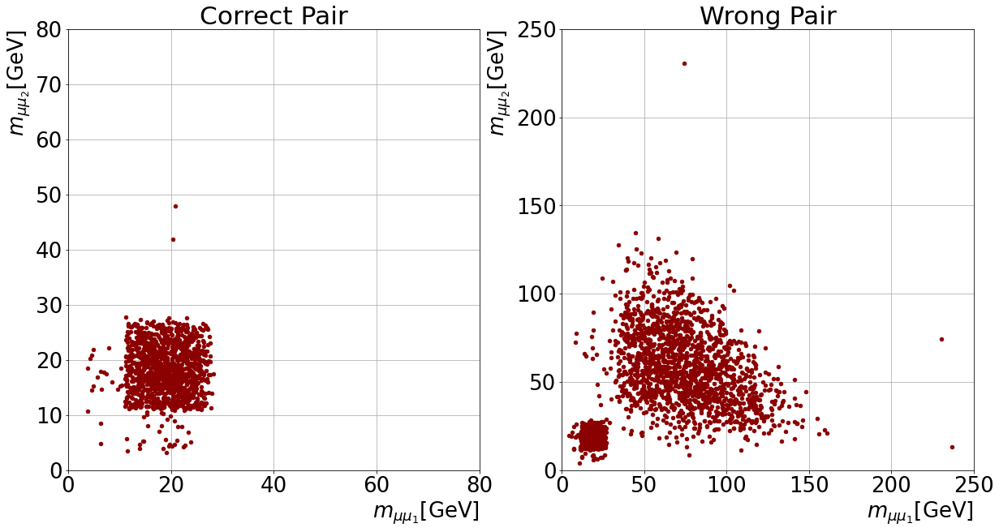

...

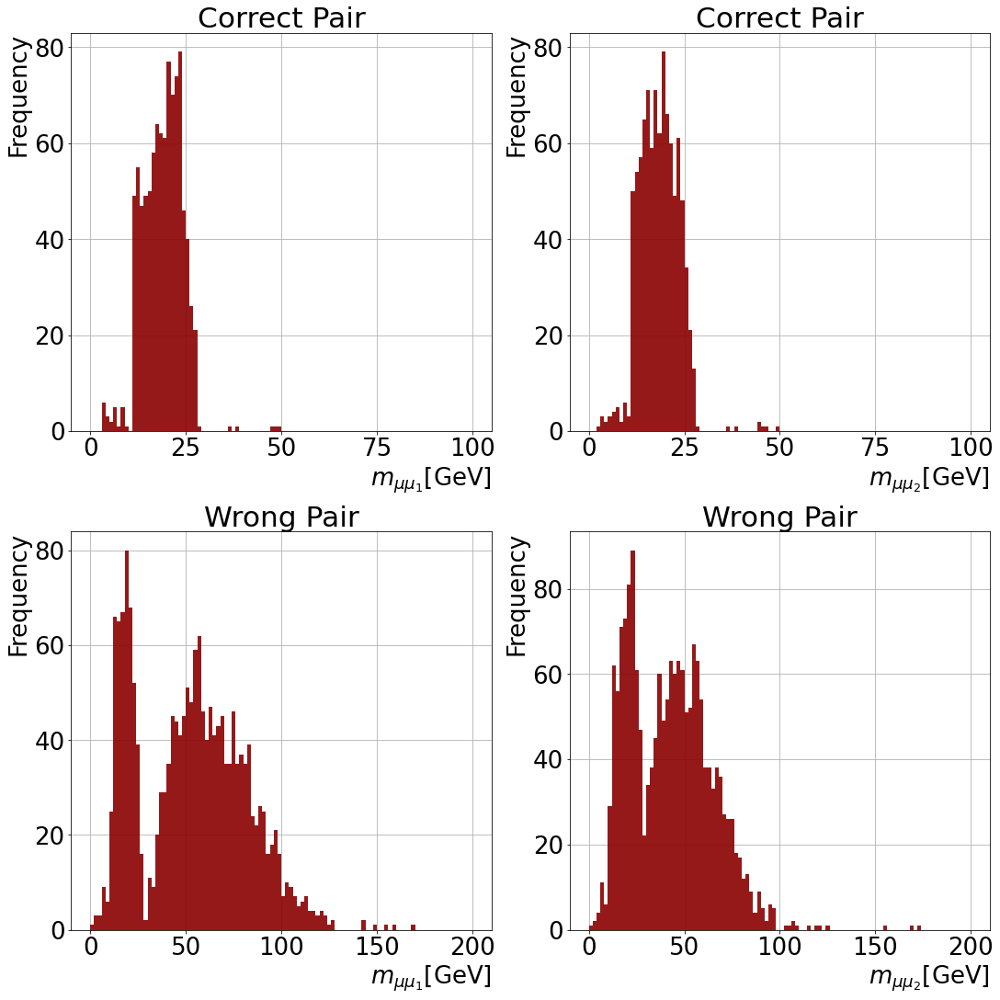

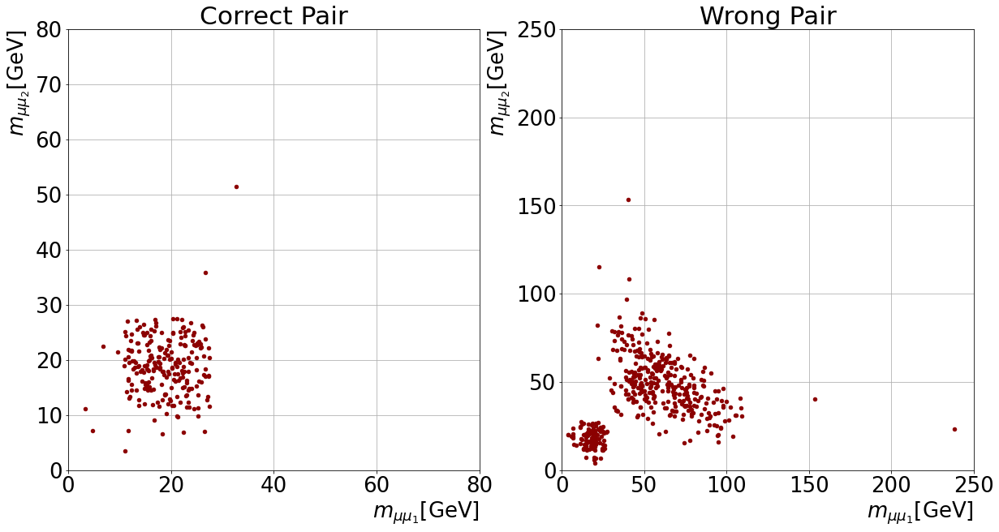

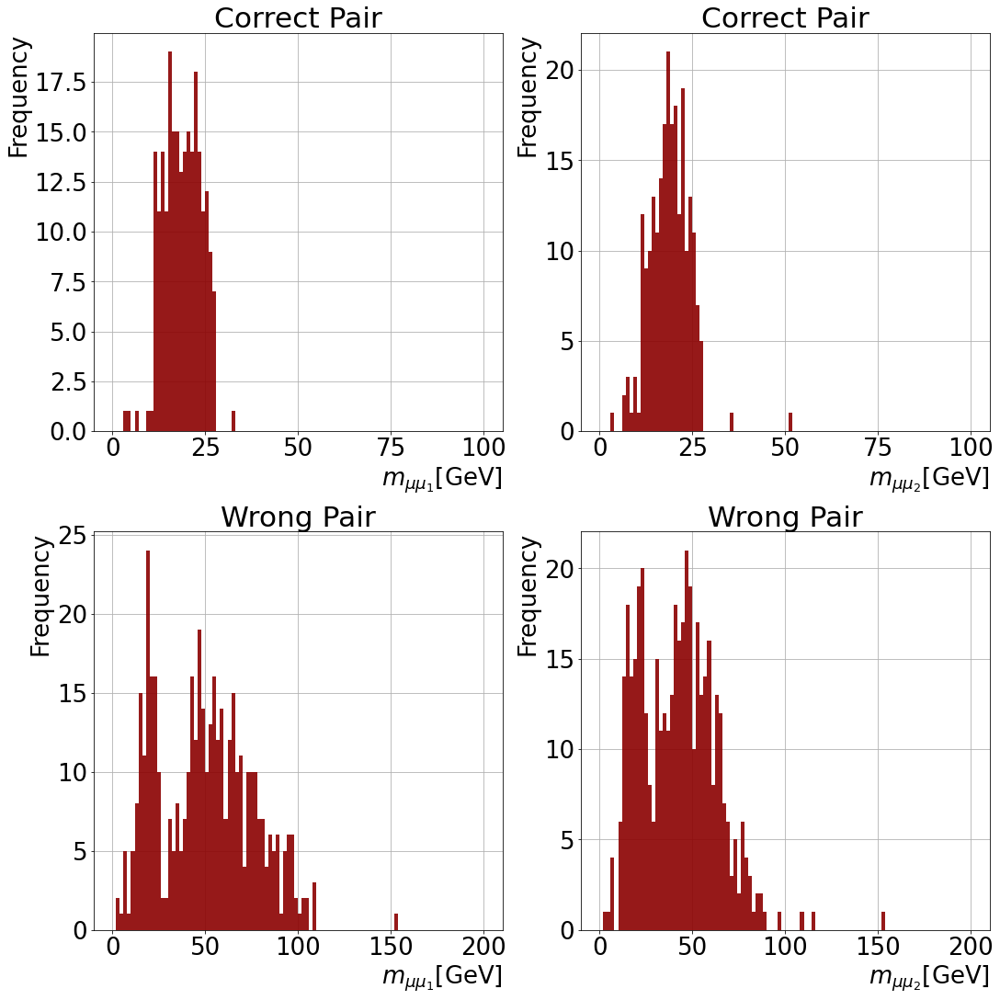

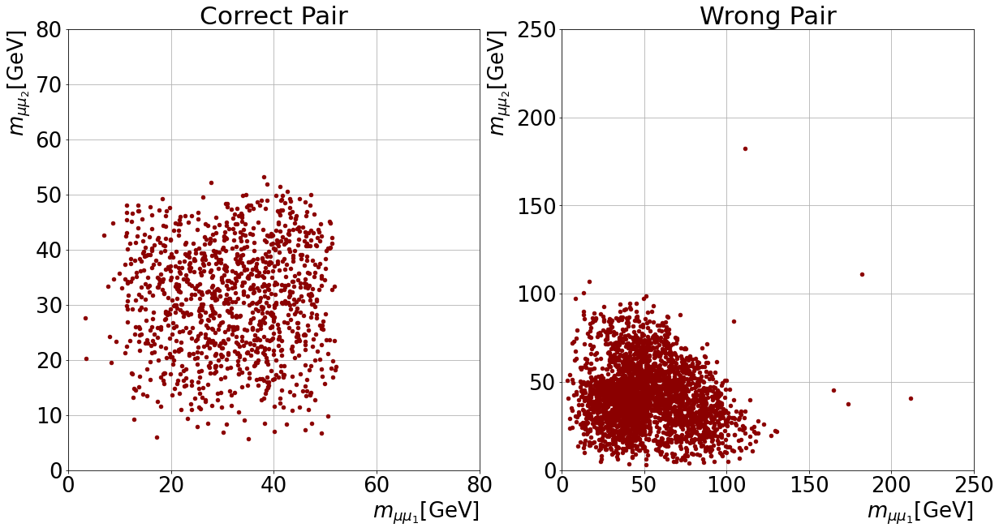

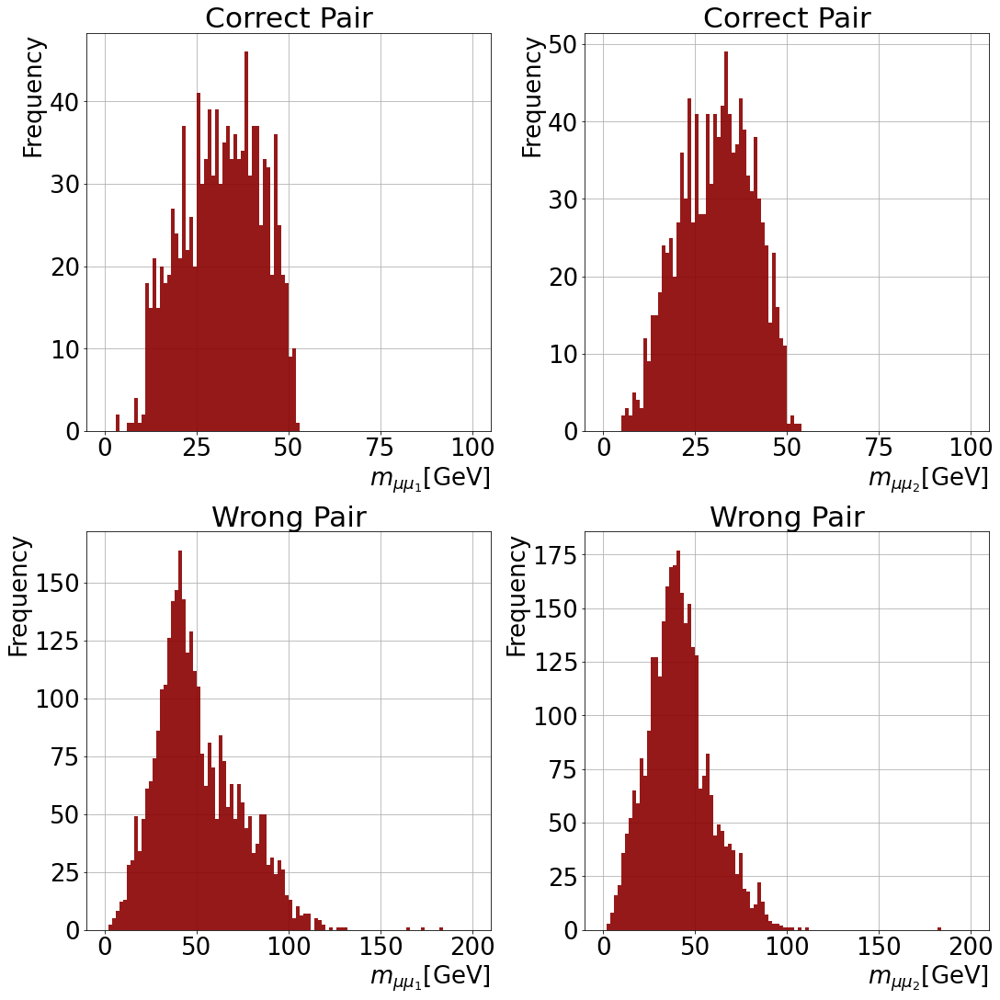

In [8]:
for key in keys:
    xgboost = xgb("sig", keys[file])
    if singlePair:
        all_sig[key]["single"] = xgboost.predict(all_sig[key]["full"], single_pair = singlePair, ret = True)
    else:
        xgboost.predict(all_sig[key])
    xgboost.plotMatch()

In [6]:
hist_sig = histogram("sig", keys)
all_sig = hist_sig.import_csv("single")
hist_sig.import_correctPairs(all_sig)
hist_sig.create_hist()
#hist_sig.plotHist()
hist_sig.create_hist_2d()
#hist_sig.plot2Dhist()

/Volumes/Memorex USB/FD_Model_ML/utilities/histUtilities.py:332: RuntimeWarning: divide by zero encountered in true_divide
  hist_2d_ratio = hist_2D_total_bkg / np.sqrt(hist_2D_total_sig)
/Volumes/Memorex USB/FD_Model_ML/utilities/histUtilities.py:334: RuntimeWarning: divide by zero encountered in true_divide
  hist_2D_divide = np.divide(hist_2D_total_sig, hist_2D_total_bkg_sq)


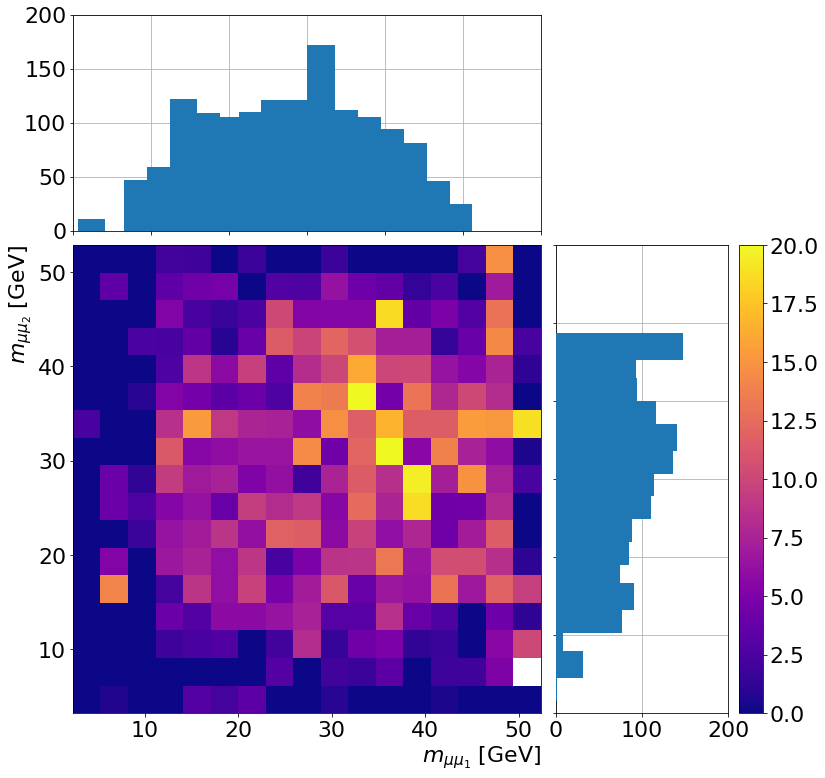

In [4]:
ratio_hist(hist_bkg.total_2d_hist_bkg, hist_sig.total_2d_hist_sig, hist_sig.histData_2d_sig)

In [7]:
invMass_bkg = hist_bkg.invMass_bkg # store invmass attribute for bkg
invMass_sig = hist_sig.invMass_sig # store invmass attribute for sig

In [8]:
from KDEpy import FFTKDE
from scipy.stats import norm

global points
global ind
global plot_order_kde
global maxy
global titles
global hist_facecolor
global hist_edgecolor
global kde_color

points         = [0, 60, 100]
ind            = np.linspace(0, 60, 100)
plot_order_kde = ["DY1J", "DY2J", "qqToZZTo4L", "DiLept", "ggHToZZTo4L", "ggToZZTo4mu"]
maxy           = 0.04
titles         = {
"DY0J"        : r'Drell-Yan, 0 Jets',
"DY1J"        : r'Drell-Yan, 1 Jet',
"DY2J"        : r'Drell-Yan, 2 Jets', 
"qqToZZTo4L"  : r'$qq\rightarrow ZZ \rightarrow 4l$',
"DiLept"      : r'Dileptons',
"ggHToZZTo4L" : r'$gg\rightarrow H \rightarrow ZZ \rightarrow 4l$',
"ggToZZTo4mu" : r'$gg\rightarrow ZZ \rightarrow 4\mu$'
}
hist_facecolor = '#2ab0ff'
hist_edgecolor = '#169acf'
kde_color      = "darkred"

In [9]:
kernel = ["gaussian", "tophat", "hello"]

In [29]:
class kde:
    def __init__(self, dataset, sig_dirs = None):
        if dataset not in ["sig", "bkg"] or dataset == None:
            raise ValueError(colors.RED + "Dataset must be specified (dataset = 'sig' or 'bkg'). Exiting...\n\n" + colors.ENDC)
            sys.exit()
        else:
            self.dataset = dataset
            
        if dataset == "sig" and sig_dirs is None:
            print(colors.RED + "The keys for each signal dataset must be specified in a list, e.g., [MZD_150_15, MZD_200_20]. Exiting...\n\n" + colors.ENDC)
            sys.exit()
        elif dataset == "sig" and sig_dirs is not None: 
            self.sig_dir = sig_dirs
        
    def calc_kde_1D(self, invMass, kdeMethod = "scipy", kernel_type = "gaussian", bw = None, verbose = False): 
        self.invMass = invMass
        del invMass
                
        if kdeMethod == "sklearn":
            if bw is None:
                print(colors.YELLOW + "WARNING: The bandwidth ('bw') should be provided when executing the function call. Setting the BW to the default of [1.99]. One specify more than one bandwidth in list format." + colors.ENDC)
                self.bw = [1.99]
            else:
                self.bw = bw
                
            #if all(kernel in kernel_type for kernel in ["gaussian", "tophat", "exponential", "linear", "cosine"]):
            #    print(colors.RED + "When using sklearn to perform the KDE the kernel must be one of the following: 'gaussian', 'tophat', 'exponential', 'linear', 'cosine'. Exiting...\n\n")
            #    sys.exit()
            #else:
            #    self.kernels = kernel_type
            self.kernels = kernel_type
                
        if self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Calculating the 1D KDEs for the background dataset using the %s method" % kdeMethod + colors.ENDC)
                
            self.pdf_bkg_1D = {} # initialize empty dict for pdfs
            self.numEvents  = {} # initialize empty dict for number of events
            keys_bkg        = list(self.invMass.keys())
            self.diMuonKey  = list(self.invMass[keys_bkg[0]].keys()) # extract keys for invMass pairs
            
            if kdeMethod == "scipy":
                self.kde_method = "scipy"
                for key in plot_order_kde:
                    self.pdf_bkg_1D[key] = {self.diMuonKey[0]: None, self.diMuonKey[1]: None} # create nested dict for both dimuon pairs
                    self.numEvents[key]  = len(self.invMass[key][self.diMuonKey[0]])
                    for pair in self.diMuonKey:
                        gkde = stats.gaussian_kde(self.invMass[key][pair])
                        self.pdf_bkg_1D[key][pair] = gkde.evaluate(ind)
                        
            elif kdeMethod == "pd":
                self.kde_method = "pd"
                print(colors.YELLOW + "KDE performed when calling plot_kde_1D()" + colors.ENDC)
                        
            elif kdeMethod == "sklearn":
                bandwidth_dict = {} # nested dictionary to hold bandwidths
                for bw in bandwidths:
                    bandwidth_dict[bw] = None

                kernel_dict = {}
                for kern in kernels: # nested dictionary to hold kernels
                    kernel_dict[kern] = bandwidth_dict
                    
                pair_dict = {}
                for pair in diMuon_key: # nested dictionary to hold dimuon pairs
                    pair_dict[pair] = kernel_dict

                for key in plot_order_kde: # construct final dictionary
                    self.pdf_bkg_1D[key] = pair_dict
                    
                self.kde_method     = "sklearn"
                self.invMass_shaped = {}
                self.vals           = np.linspace(0, 60, 100)
                for key in plot_order_kde:
                    self.invMass_shaped[key] = {self.diMuonKey[0]: None, self.diMuonKey[1]: None} # create nested dict for both dimuon pairs
                    self.numEvents[key]      = len(self.invMass[key][self.diMuonKey[0]])
                    for pair in self.diMuonKey:
                        for kernel in self.kernels:
                            for bandwidth in self.bw:
                                self.invMass_shaped[key][pair]   = self.invMass[key][pair].reshape(-1, 1)
                                temp_kde  = KernelDensity(kernel = kernel, bandwidth = bandwidth).fit(self.invMass_shaped[key][pair]) # kde object
                                temp_prob = temp_kde.score_samples(self.vals.reshape(-1,1))
                                self.pdf_bkg_1D[key][pair][kernel][bandwidth] = np.exp(temp_prob)

        elif self.dataset == "sig":
            if verbose:
                print(colors.GREEN + "Calculating the 1D KDEs for the signal dataset using the %s method" % kde_method + colors.ENDC)
                
            self.pdf_sig_1D = {} # initialize empty dict for pdfs
            self.numEvents  = {} # initialize empty dict for number of events
            self.keys_sig   = list(self.invMass.keys())
            self.diMuonKey  = list(self.invMass[self.keys_sig[0]].keys()) # extract keys for invMass pairs
            
            if kdeMethod == "scipy":
                self.kde_method = "scipy"
                for key in self.sig_dir:
                    self.pdf_sig_1D[key] = {self.diMuonKey[0]: None, self.diMuonKey[1]: None}
                    self.numEvents[key]  = len(self.invMass[key][self.diMuonKey[0]])
                    for pair in self.diMuonKey:
                        gkde = stats.gaussian_kde(self.invMass[key][pair])
                        self.pdf_sig_1D[key][pair] = gkde.evaluate(ind)
            
            elif kdeMethod == "pd":
                self.kde_method = "pd"
                print(colors.YELLOW + "KDE performed when calling plot_kde_1D()" + colors.ENDC)
                        
            elif kdeMethod == "sklearn":
                bandwidth_dict = {} # nested dictionary to hold bandwidths
                for bw in bandwidths:
                    bandwidth_dict[bw] = None

                kernel_dict = {}
                for kern in kernels: # nested dictionary to hold kernels
                    kernel_dict[kern] = bandwidth_dict
                    
                pair_dict = {}
                for pair in diMuon_key: # nested dictionary to hold dimuon pairs
                    pair_dict[pair] = kernel_dict

                for key in plot_order_kde: # construct final dictionary
                    self.pdf_bkg_1D[key] = pair_dict
                
                print("\n\n", self.pdf_sig_1D, "\n\n")
                    
                self.kde_method     = "sklearn"
                self.invMass_shaped = {}
                self.vals           = np.linspace(0, 60, 100)
                
                for key in plot_order_kde:
                    self.invMass_shaped[key] = {self.diMuonKey[0]: None, self.diMuonKey[1]: None} # create nested dict for both dimuon pairs
                    self.pdf_sig_1D[key]     = {self.diMuonKey[0]: None, self.diMuonKey[1]: None}
                    self.numEvents[key]      = len(self.invMass[key][self.diMuonKey[0]])
                    for pair in self.diMuonKey:
                        for bandwidth in self.bw:
                            for kernel in self.kernels:
                                self.invMass_shaped[key][pair]   = self.invMass[key][pair].reshape(-1, 1)
                                temp_kde  = KernelDensity(kernel = kernel, bandwidth = bandwidth).fit(self.invMass_shaped[key][pair]) # kde object
                                temp_prob = temp_kde.score_samples(self.vals.reshape(-1,1))
                                self.pdf_sig_1D[key][pair][kernel][bandwidth] = np.exp(temp_prob)
    
    def plot_kde_1D(self, save = True, scott = True, bw = None, verbose = False, suppress = False):
        if verbose:
            print(colors.GREEN + "Plotting the 1D KDEs for the background dataset\n" + colors.ENDC)
            
        if self.dataset == "bkg":
            if self.kde_method == "scipy":
                for key in plot_order_kde:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
                    ax = ax.ravel() # unravel ax object to easily index 
                    cnt = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        ax[cnt].hist(self.invMass[key][pair], bins = 100, range = (0, 60), label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.7, density = 1)
                        ax[cnt].plot(ind, self.pdf_bkg_1D[key][pair], color = kde_color, linewidth = 3, label = 'BW: Scott')
                        ax[cnt].set_xlim(hist_range)
                        ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                        ax[cnt].set_ylabel('Probability', loc = "top")
                        ax[cnt].grid()
                        ax[cnt].grid(which = 'minor', alpha = 0.2)
                        ax[cnt].grid(which = 'major', alpha = 0.5)
                        ax[cnt].legend(loc = 'upper left', fontsize = 18, shadow = True, borderpad = 1)
                        
                        cnt += 1
                
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                        
                    if save:
                        fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s.pdf" % self.kde_method, bbox_inches='tight')
                   
            elif self.kde_method == "pd":
                for key in plot_order_kde:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows=1, ncols=2)
                    ax      = ax.ravel() # unravel ax object to easily index 
                    cnt     = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        colName    = key + "_" + pair
                        tempDF     = pd.DataFrame(self.invMass[key][pair], columns = [colName])

                        tempDF.hist(bins = 100, range = (-20, 80), label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.8, density = 1, ax = ax[cnt])
                        if scott:
                            tempDF.plot.kde(label = 'KDE: Scott', color = "red", linewidth = 3, ax = ax[cnt]);

                        if bw is not None:
                            if type(bw) is list:
                                for bandwidth in bw:
                                    tempKDEplot = tempDFplot.kde(bw_method = bandwidth, label ='KDE: BW = %.2f' % bandwidth, linewidth = 3, ax = ax[cnt])
                            elif type(bw) is float or int:
                                tempKDEplot = tempDFplot.kde(bw_method = bandwidth, label ='KDE: BW = %.2f' % bandwidth, linewidth = 3, ax = ax[cnt])

                        ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                        ax[cnt].set_ylabel('Probability')
                        ax[cnt].grid()
                        ax[cnt].legend(['KDE: Scott', 'KDE: BW = 0.64', 'Hist'], loc = 'upper left', fontsize = 16, shadow = True, borderpad = 1)
                        ax[cnt].grid(which = 'minor', alpha = 0.2)
                        ax[cnt].grid(which = 'major', alpha = 0.5)
                        
                        if suppress:
                            plt.close()
                        else:
                            plt.show()
                        
                        if save:
                            fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s.pdf" % self.kde_method, bbox_inches='tight')
                                
            elif self.kde_method == "sklearn":
                for key in plot_order_kde:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
                    ax      = ax.ravel() # unravel ax object to easily index 
                    cnt     = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        ax[cnt].hist(self.invMass_shaped[key][pair], bins = 100, range = hist_range, label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.7, density = 1)
                        for bandwidth in self.bw:
                            for kernel in self.kernels:
                                ax[cnt].plot(self.vals, self.pdf_bkg_1D[key][pair][kernel][bandwidth], label = 'Kernel = %s, BW = %.2f' % (kernel, bandwidth), linewidth = 3)
                                ax[cnt].set_xlim(hist_range)
                                ax[cnt].grid()
                                ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                                ax[cnt].set_ylabel('Probability')
                                ax[cnt].legend(fontsize = 14)
                                #ax[cnt].legend(['KDE: BW = %.2f' % self.bw, 'Scott', label_name], loc = 'upper left', fontsize = 16, shadow = True, borderpad = 1)
                                # ax.legend([hist, kde_sc, kde_0p03], ['Hist', 'KDE: Scott', 'KDE: BW = 0.03'])
                                ax[cnt].grid(which = 'minor', alpha = 0.2)
                                ax[cnt].grid(which = 'major', alpha = 0.5)

                        cnt += 1

                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                            
                    if save:
                        fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s_bw_%.2f_kernel_%s.pdf" % (self.kde_method, bandwidth, kernel), bbox_inches = 'tight')
                              
        if self.dataset == "sig":
            if self.kde_method == "scipy":
                for key in self.sig_dir:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
                    ax      = ax.ravel() # unravel ax object to easily index 
                    cnt     = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        ax[cnt].hist(self.invMass[key][pair], bins = 100, range = (0, 60), label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.7, density = 1)
                        ax[cnt].plot(ind, self.pdf_sig_1D[key][pair], color = kde_color, linewidth = 3, label = 'BW: Scott')
                        ax[cnt].set_xlim(hist_range)
                        ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                        ax[cnt].set_ylabel('Probability', loc = "top")
                        ax[cnt].grid()
                        ax[cnt].grid(which = 'minor', alpha = 0.2)
                        ax[cnt].grid(which = 'major', alpha = 0.5)
                        ax[cnt].legend(loc = 'upper left', fontsize = 18, shadow = True, borderpad = 1)
                        
                        cnt += 1
                        
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                        
                    if save:
                        fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s.pdf" % self.kde_method, bbox_inches='tight')
                        
            elif self.kde_method == "pd":
                for key in self.sig_dir:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
                    ax = ax.ravel() # unravel ax object to easily index 
                    cnt = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        colName    = key + "_" + pair
                        tempDF     = pd.DataFrame(self.invMass[key][pair], columns = [colName])

                        tempDF.hist(bins = 100, range = (-20, 80), label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.8, density = 1, ax = ax[cnt])
                        if scott:
                            tempDF.plot.kde(label = 'KDE: Scott', color = "red", linewidth = 3, ax = ax[cnt]);

                        if bw is not None:
                            if type(bw) is list:
                                for bandwidth in bw:
                                    tempKDEplot = tempDFplot.kde(bw_method = bandwidth, label ='KDE: BW = %.2f' % bandwidth, linewidth = 3, ax = ax[cnt])
                            elif type(bw) is float or int:
                                tempKDEplot = tempDFplot.kde(bw_method = bandwidth, label ='KDE: BW = %.2f' % bandwidth, linewidth = 3, ax = ax[cnt])

                        ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                        ax[cnt].set_ylabel('Probability')
                        ax[cnt].grid()
                        ax[cnt].legend(['KDE: Scott', 'KDE: BW = 0.64', 'Hist'], loc = 'upper left', fontsize = 16, shadow = True, borderpad = 1)
                        ax[cnt].grid(which = 'minor', alpha = 0.2)
                        ax[cnt].grid(which = 'major', alpha = 0.5)
                        
                        if suppress:
                            plt.close()
                        else:
                            plt.show()
                            
                        if save:
                            fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s.pdf" % self.kde_method, bbox_inches='tight')
                                
            elif self.kde_method == "sklearn":
                for key in self.sig_dir:
                    fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
                    ax      = ax.ravel() # unravel ax object to easily index 
                    cnt     = 0
                    for pair in self.diMuonKey:
                        label_name = key + "_" + pair[-2:]
                        ax[cnt].hist(self.invMass_shaped[key][pair], bins = 100, range = hist_range, label = label_name, facecolor = hist_facecolor, edgecolor = hist_edgecolor, alpha = 0.7, density = 1)
                        for bandwidth in self.bw:
                            for kernel in self.kernels:
                                ax[cnt].plot(self.vals, self.pdf_sig_1D[key][pair][kernel][bandwidth], label = 'Kernel = %s, BW = %.2f' % (kernel, bandwidth), linewidth = 3)
                                ax[cnt].set_xlim(hist_range)
                                ax[cnt].grid()
                                ax[cnt].set_xlabel(r"$m_{\mu\mu_{%d}}$ [GeV]" % (cnt + 1), loc = 'right')
                                ax[cnt].set_ylabel('Probability')
                                ax[cnt].legend()
                                #ax[cnt].legend(['KDE: BW = %.2f' % self.bw, 'Scott', label_name], loc = 'upper left', fontsize = 16, shadow = True, borderpad = 1)
                                # ax.legend([hist, kde_sc, kde_0p03], ['Hist', 'KDE: Scott', 'KDE: BW = 0.03'])
                                ax[cnt].grid(which = 'minor', alpha = 0.2)
                                ax[cnt].grid(which = 'major', alpha = 0.5)

                        cnt += 1

                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                            
                    if save:
                        fig.savefig(dataDir + key + "/" + key + "_kde_1D_%s_bw_%.2f_kernel_%s.pdf" % (self.kde_method, bandwidth, kernel), bbox_inches = 'tight')
                    
    def total_bkg_1D(self, sf = True, verbose = False):
        if sf:
            self.bkg_1D_scaled = True
        else:
            self.bkg_1D_scaled = False
            
        if self.kde_method == "pd":
            print("Cannot calculate the total KDE estimate for the background using the pandas ('pd') method. Exiting...\n")
            sys.exit()
        
        if self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Calculating the total 1D background PDFs" + colors.ENDC)
                
            if self.kde_method == "scipy":
                if sf:
                    self.total_pdf_1D_scaled = {self.diMuonKey[0]: None, self.diMuonKey[1]: None}
                else:
                    self.total_pdf_1D = {self.diMuonKey[0]: None, self.diMuonKey[1]: None}
                    
                tempA0 = 0 
                tempA1 = 0
                for key in plot_order_kde:
                    for pair in self.diMuonKey:
                        if pair == "invMassA0":
                            if sf:
                                tempA0 +=  self.pdf_bkg_1D[key][pair] * scale_factors_bkg[key] * self.numEvents[key]
                            else:
                                tempA0 +=  self.pdf_bkg_1D[key][pair]
                        elif pair == "invMassA1":
                            if sf:
                                tempA1 +=  self.pdf_bkg_1D[key][pair] * scale_factors_bkg[key] * self.numEvents[key]
                            else:
                                tempA1 +=  self.pdf_bkg_1D[key][pair]
                if sf:
                    self.total_pdf_1D_scaled["invMassA0"] = tempA0
                    self.total_pdf_1D_scaled["invMassA1"] = tempA1
                else:
                    self.total_pdf_1D["invMassA0"] = tempA0
                    self.total_pdf_1D["invMassA1"] = tempA1
        elif self.dataset == "sig":
            print(colors.RED+ "Not implemented for signal dataset! Exiting...\n" + colors.ENDC)
            sys.exit()
    
    def calc_kde_2D(self, method = 0, check = "det", verbose = False, **kwargs):
        '''
        **kwargs:
        custom_bin : custom bin number for use with method 0 only
        '''
        self.kde_2D       = {}
        self.kde_2Dmethod = method
                    
        if method == 0:
            if "custom_bin" not in kwargs.keys():
                self.custom_bin_2D = None
                xx, yy             = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
            elif "custom_bin" in kwargs.keys():
                if type(kwargs["custom_bin"]) != complex:
                    print(colors.RED + "ERROR: The total bin number must be provided in the form of a complex number, e.g., 200j. Exiting...\n\n" + colors.ENDC)
                    sys.exit()
                
                if int(kwargs["custom_bin"].imag) < 10:
                    print(colors.RED + "ERROR: The KDE estimate must have more than 10 bins! Exiting...\n\n" + colors.ENDC)
                    sys.exit()

                self.custom_bin_2D = kwargs["custom_bin"]
                xx, yy             = np.mgrid[hist_range[0]:hist_range[1]:self.custom_bin_2D, hist_range[0]:hist_range[1]:self.custom_bin_2D]            

        if self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Calculating the 2D background PDFs for the background dataset\n" + colors.ENDC)
                
            if self.kde_method == "scipy" or self.kde_method == "sklearn":
                if method == 0: # perform kde estimate on 2D field
                    self.kde_2Dmethod = 0
                    for key in plot_order_kde:
                        values    = np.vstack([self.invMass[key][self.diMuonKey[0]], self.invMass[key][self.diMuonKey[1]]])
                        positions = np.vstack([xx.ravel(), yy.ravel()])
                        kernel    = st.gaussian_kde(values)

                        self.kde_2D[key] = np.reshape(kernel(positions).T, xx.shape)
                elif method == 1: # use outer product of kde pdfs previously calculated
                    self.kde_2Dmethod = 1
                    for key in plot_order_kde:
                        self.kde_2D[key]       = np.outer(self.pdf_bkg_1D[key][self.diMuonKey[0]], self.pdf_bkg_1D[key][self.diMuonKey[1]])
            elif self.kde_method == "pd":
                print(colors.RED + "2D KDE not implemented for pandas method." + colors.ENDC)
                sys.exit()
                
        elif self.dataset == "sig":
            if verbose:
                print(colors.GREEN + "Calculating the 2D background PDFs for the signal dataset\n" + colors.ENDC)
                
            if self.kde_method == "scipy" or self.kde_method == "sklearn":
                 # perform kde estimate on 2D field
                if method == 0:
                    self.kde_2Dmethod = 0
                    for key in self.sig_dir:
                        values    = np.vstack([self.invMass[key][self.diMuonKey[0]], self.invMass[key][self.diMuonKey[1]]])
                        positions = np.vstack([xx.ravel(), yy.ravel()])
                        kernel    = st.gaussian_kde(values)

                        self.kde_2D[key] = np.reshape(kernel(positions).T, xx.shape)                        
                elif method == 1: # use outer product of 1D kde pdfs previously calculated
                    self.kde_2Dmethod = 1
                    for key in self.sig_dir:
                        self.kde_2D[key] = np.outer(self.pdf_sig_1D[key][self.diMuonKey[0]], self.pdf_sig_1D[key][self.diMuonKey[1]])
            elif self.kde_method == "pd":
                print("2D KDE not implemented for pandas method.")
                sys.exit()
                                                            
    def calc_total_bkg_2D(self, sf = True, ret = False, verbose = False):
        if self.dataset == "sig":
            print(colors.RED + "calc_total_bkg_2D() can only be used for background data! Exiting...\n\n" + colors.ENDC)
            sys.exit()
        elif self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Calculating the total background PDF using method %s\n" % self.kde_2Dmethod + colors.ENDC)
                
            if self.kde_2Dmethod == 0:
                self.total_pdf_2D = 0
            elif self.kde_2Dmethod == 1 and self.bkg_1D_scaled == False:
                self.total_pdf_2D = 0
            elif self.kde_2Dmethod == 1 and self.bkg_1D_scaled == True:
                self.total_pdf_2D_prescaled = 0
                
            if self.kde_2Dmethod == 0:
                for key in plot_order_kde:
                    if sf:
                        self.total_pdf_2D +=  self.kde_2D[key] * scale_factors_bkg[key] * self.numEvents[key]  # ?????
                    else:
                        self.total_pdf_2D +=  self.kde_2D[key]
            elif self.kde_2Dmethod == 1:
                if self.bkg_1D_scaled: # Don't apply scale factors a second time when calculating the total bkg KDE
                        self.total_pdf_2D_prescaled = np.outer(self.total_pdf_1D_scaled[self.diMuonKey[0]], self.total_pdf_1D_scaled[self.diMuonKey[1]]) 
                else:
                    total_sf = 0
                    for key in plot_order_kde:
                        total_sf += scale_factors_bkg[key] * self.numEvents[key] 
                    
                    self.total_pdf_2D += np.outer(self.total_pdf_1D[self.diMuonKey[0]], self.total_pdf_1D[self.diMuonKey[1]])
                    
        if ret:
            if self.bkg_1D_scaled:
                return self.total_pdf_2D_prescaled
            else:
                return self.total_pdf_2D
            
    def plot_kde_total_1D(self, sf = True, save = True, suppress = True):
        fig, ax = plt.subplots(figsize = (20, 10), nrows = 1, ncols = 2)
        ax = ax.ravel()
        cnt = 0
        for pair in self.diMuonKey:
            if sf:
                ax[cnt].plot(ind, self.total_pdf_1D_scaled[pair], color = "darkred", linewidth = 3)
            else:
                ax[cnt].plot(ind, self.total_pdf_1D[pair], color = "darkred", linewidth = 3)
            ax[cnt].set_xlabel(r"$m_{\mu\mu_{%s}}$ [GeV]" % str(cnt + 1), loc = "right")
            ax[cnt].set_ylabel('Number of events', loc = "top")
            ax[cnt].grid()
            ax[cnt].grid(which = "minor", alpha = 0.2)
            ax[cnt].grid(which = "major", alpha = 0.5)
            ax[cnt].set_ylim(0, 2)
            
            cnt += 1
            
        if suppress:
            plt.close()
        else:
            plt.show()

        if save:
            fig.savefig(dataDir + "total_background_kde_1D_%s.pdf" % self.kde_method, bbox_inches = 'tight')
            
        
    def plot_kde_2D(self, style = "filled", verbose = False, save = True, suppress = True, **kwargs):
        '''
        **kwargs:
        plot_dir   : string, name of plot dir
        file_base  : string, base name for plot
        '''
        
        if self.kde_2Dmethod  == 0:
            if self.custom_bin_2D is None:
                xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
            elif self.custom_bin_2D is not None:
                xx, yy = np.mgrid[hist_range[0]:hist_range[1]:self.custom_bin_2D, hist_range[0]:hist_range[1]:self.custom_bin_2D]
        elif self.kde_2Dmethod == 1:
            self.custom_bin_2D = 1
            xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
            
        if self.custom_bin_2D is not None and len(kwargs) == 0:
            print("self.custom_bin_2D is not None and kwargs is None", self.custom_bin_2D)
        
        if self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Plotting the 2D KDEs for the background dataset\n" + colors.ENDC)
                
            if self.kde_method == "scipy" or self.kde_method == "sklearn":
                for key in plot_order_kde:
                    fig, ax = plt.subplots(figsize = (14, 10))
                    ax.set_xlim(hist_range)
                    ax.set_ylim(hist_range)
                    if style == "contour":
                        cset = ax.contour(xx, yy, self.kde_2D[key], colors = 'k')
                        ax.clabel(cset, inline = 1, fontsize = 10)
                        
                    # Filled contour plot
                    plt.contourf(xx, yy, self.kde_2D[key], cmap = 'coolwarm')
                    plt.colorbar()
                    ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
                    ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")
                    ax.set_title(titles[key])
                    
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                            
                    if save:
                        if self.custom_bin_2D is None and len(kwargs) == 0:
                            fig.savefig(dataDir + key + "/" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif self.custom_bin_2D is not None and len(kwargs) == 0:
                            fig.savefig(dataDir + key + "/" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                        elif self.custom_bin_2D is None and len(kwargs) != 0:
                            if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                                fig.savefig(kwargs["plot_dir"] + "/" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                            elif all(key in kwargs for key in ("plot_dir", "file_base")):
                                fig.savefig(kwargs["plot_dir"] + "/" + kwargs["file_base"] + "_" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif self.custom_bin_2D is not None and len(kwargs) != 0:
                            if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                                fig.savefig(kwargs["plot_dir"] + "/" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                            elif all(key in kwargs for key in ("plot_dir", "file_base")):
                                fig.savefig(kwargs["plot_dir"] + "/" + kwargs["file_base"] + "_" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                            
                            
        if self.dataset == "sig":
            if self.kde_method == "scipy" or self.kde_method == "sklearn":
                if verbose:
                    print(colors.GREEN + "Plotting the 2D KDEs for the signal dataset\n\n" + colors.ENDC)
                    
                for key in self.sig_dir:
                    fig, ax = plt.subplots(figsize = (14, 10))
                    ax.set_xlim(hist_range)
                    ax.set_ylim(hist_range)
                    if style == "contour":
                        cset = ax.contour(xx, yy, self.kde_2D[key], colors = 'k')
                        ax.clabel(cset, inline = 1, fontsize = 10)
                        
                    # Filled contour plot
                    plt.contourf(xx, yy, self.kde_2D[key], cmap = 'coolwarm')
                    plt.colorbar()
                    ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
                    ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")                    
                    ax.set_title(r'$m_{Z_{D}} = $ %s, $m_{f_{D1}} = $ %s GeV' % (key.split("_")[1], key.split("_")[2]))
                    
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                    
                    if save:
                        if self.custom_bin_2D is None and len(kwargs) == 0:
                            fig.savefig(dataDir + key + "/" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif self.custom_bin_2D is not None and len(kwargs) == 0:
                            fig.savefig(dataDir + key + "/" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                        elif self.custom_bin_2D is None and len(kwargs) != 0:
                            if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                                fig.savefig(kwargs["plot_dir"] + "/" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                            elif all(key in kwargs for key in ("plot_dir", "file_base")):
                                fig.savefig(kwargs["plot_dir"] + "/" + kwargs["file_base"] + "_" + key + "_bkg_kde_2D_%s_method_%d_%s.pdf" % (style, self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif self.custom_bin_2D is not None and len(kwargs) != 0:
                            if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                                fig.savefig(kwargs["plot_dir"] + "/" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                            elif all(key in kwargs for key in ("plot_dir", "file_base")):
                                fig.savefig(kwargs["plot_dir"] + "/" + kwargs["file_base"] + "_" + key + "_bkg_kde_2D_%s_method_%d_%s_bins_%d.pdf" % (style, self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                            
    def plot_total_kde_2D(self, verbose = False, save = True, suppress = True, **kwargs):
        if self.kde_2Dmethod == None:
            print(colors.RED + "Must perform 2D KDE calculation using calc_kde_2D(). Exiting..." + colors.ENDC)
            sys.exit()
        if self.dataset == "sig":
            print(colors.RED + "Total KDE can only be plotted for background samples. Exiting..." + colors.ENDC)
            sys.exit()
        elif self.dataset == "bkg":
            if verbose:
                print(colors.GREEN + "Plotting the total 2D background KDE\n\n" + colors.ENDC)
                
            if self.kde_method == "scipy" or "sklearn":
                if self.kde_2Dmethod == 0:
                    if self.custom_bin_2D is not None:
                        xx, yy = np.mgrid[hist_range[0]:hist_range[1]:self.custom_bin_2D, hist_range[0]:hist_range[1]:self.custom_bin_2D]
                    else:
                        xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
                        
                    fig = plt.figure(figsize = (14, 10))
                    ax  = fig.gca()
                    ax.set_xlim(hist_range)
                    ax.set_ylim(hist_range)
                    plt.contourf(xx, yy, self.total_pdf_2D, cmap = 'coolwarm')
                    plt.colorbar()
                    ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
                    ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")
                    ax.set_title('Total Background')
                    
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                        
                elif self.kde_2Dmethod == 1:
                    self.custom_bin_2D = 1
                    xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
                        
                    fig = plt.figure(figsize = (14, 10))
                    ax  = fig.gca()
                    ax.set_xlim(hist_range)
                    ax.set_ylim(hist_range)
                    if self.bkg_1D_scaled:
                        plt.contourf(xx, yy, self.total_pdf_2D_prescaled, cmap = 'coolwarm')
                    else:
                        plt.contourf(xx, yy, self.total_pdf_2D, cmap = 'coolwarm')
                        
                    plt.colorbar()
                    ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
                    ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")
                    ax.set_title('Total Background')
                    
                    if suppress:
                        plt.close()
                    else:
                        plt.show()
                    
                if save:
                    if len(kwargs) == 0 and self.custom_bin_2D is None:
                        fig.savefig(dataDir + "kde_total_2D_method_%d_%s.pdf" % (self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                    elif len(kwargs) == 0 and self.custom_bin_2D is not None:
                        fig.savefig(dataDir + "kde_total_2D_method_%d_%s_bins_%d.pdf" % (self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                    elif self.custom_bin_2D is None and len(kwargs) != 0:
                        if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                            fig.savefig(kwargs["plot_dir"] + "/kde_total_2D_method_%d_%s_bins.pdf" % (self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif "plot_dir" not in kwargs.keys() and "file_base" in kwargs.keys():
                            fig.savefig(dataDir + kwargs["file_base"] + "_" + key + "kde_total_2D_method_%d_%s.pdf" % (self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                        elif all(key in kwargs for key in ("plot_dir", "file_base")):
                            fig.savefig(plot_dir + "/" + kwargs["file_base"] + "_" + key + "kde_total_2D_method_%d_%s.pdf" % (self.kde_2Dmethod, self.kde_method), bbox_inches = 'tight')
                    elif self.custom_bin_2D is not None and kwargs is not None:
                        if "plot_dir" in kwargs.keys() and "file_base" not in kwargs.keys():
                            fig.savefig(kwargs["plot_dir"] + "/kde_total_2D_method_%d_%s_bins_%d.pdf" % (self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                        if "plot_dir" not in kwargs.keys() and "file_base" in kwargs.keys():
                            fig.savefig(dataDir + kwargs["file_base"] + "_" +  key + "kde_total_2D_method_%d_%s_bins_%d.pdf" % (self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                        elif all(key in kwargs for key in ("plot_dir", "file_base")):
                            fig.savefig(kwargs["plot_dir"] + "/" + kwargs["file_base"] + "_" + key + "kde_total_2D_method_%d_%s_bins_%d.pdf" % (self.kde_2Dmethod, self.kde_method, int(self.custom_bin_2D.imag)), bbox_inches = 'tight')
                        
    def french_flag(self, total_bkg_kde_2D, contour = False, verbose = False, save = True):
        if self.kde_method == "bkg":
            print(colors.YELLOW + "French flag plots created from signal / background; please initialize the kde() object as 'sig' and load input the total 2D background KDE at the time of execution." + colors.ENDC)
        
        if verbose:
            print(colors.GREEN + "Producing the French flag plots\n\n" + colors.ENDC)
        
        cMap   = ListedColormap(['blue', 'white', 'red']) # define custom color map (french flag)
        xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
        
        for key in self.sig_dir:
            divided_kde = np.divide((self.kde_2D[key] * scale_factors_sig[key] * self.numEvents[key]), np.sqrt(total_bkg_kde_2D))
            
            fig  = plt.figure(figsize = (13, 10))
            ax   = fig.gca()
            
            ax.set_xlim(hist_range)
            ax.set_ylim(hist_range)
            
            plt.contourf(xx, yy, divided_kde, [0, 0.2, 1, 3], extend = 'max', colors = ['blue', 'white', 'red'])
            cbar = plt.colorbar(ticks = [0.1, 0.6, 2], drawedges = True)
            cbar.outline.set_color('black')
            cbar.outline.set_linewidth(2)
            cbar.ax.set_yticklabels(["<0.2: CR", "0.2-1", ">1: SR"])  # vertically oriented colorbar
            if contour:
                cset = ax.contour(xx, yy, divided_kde, [0, 0.2,  1, 3] , extend = 'max', colors = 'k')
                ax.clabel(cset, inline = 1, fontsize = 10)
                
            ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
            ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")
            ax.set_title(r'Ratio $S/\sqrt{B}, m_{Z_{D}} = %s, m_{f_{D1}} = %s$ GeV' % (key.split("_")[1], key.split("_")[2]))
            
            if save:
                fig.savefig(dataDir + key + "/" + key + "_french_flag_method_%d.pdf" % self.kde_2Dmethod[key], bbox_inches = 'tight')    
    
    '''
    def calc_total_sig_2D(self, samples, verbose = False, ret = True):
        if self.dataset == "bkg":
            print(colors.RED + "calc_total_sig_2D() can only be used for signal! Exiting...\n\n" + colors.ENDC)
            sys.exit()
        elif self.dataset == "sig":
            self.total_kde_sig = True
            self.total_pdf_2D = 0
            if verbose:
                temp_str    = ""
                num_samples = len(samples)
                cnt         = 0
                for key in samples:
                    if cnt < num_samples:
                        temp_str += key + ", "
                    elif cnt == num_samples:
                        temp_str += key
                    
                    cnt += 1
                print(colors.GREEN + "Calculating the total 2D KDE for the following signal datasets: %s", temp_str  + colors.ENDC)
                
            for key in samples:
                if self.kde_2Dmethod[key] == 0:
                    self.total_pdf_2D +=  self.kde_2D[key] * scale_factors_sig[key] * self.numEvents[key]
                elif self.kde_2Dmethod[key] == 1:
                    
                    self.total_pdf_2D = np.outer(self.total_pdf_1D[self.diMuonKey[0]], self.total_pdf_1D[self.diMuonKey[1]])
            
        if ret:
            return self.total_pdf_2D

    def plot_total_sig_kde_2D(self, samples, save = False):
        if self.total_kde_sig == None:
            print(colors.RED + "Must perform 2D KDE calculation using ccalc_total_sig_2D(). Exiting...\n\n" + colors.ENDC)
            sys.exit()
        if self.dataset == "bkg":
            print(colors.RED + "Total 2D signal KDE can only be plotted for signal samples. Exiting...\n\n" + colors.ENDC)
            sys.exit()
        elif self.dataset == "sig":
            if verbose:
                temp_str    = ""
                num_samples = len(samples)
                cnt         = 0
                for key in samples:
                    if cnt < num_samples:
                        temp_str += key + ", "
                    elif cnt == num_samples:
                        temp_str += key
                    
                    cnt += 1
                print(colors.GREEN + "Plotting the total 2D signal KDE for %s\n\n" % temp_str + colors.ENDC)
        
            xx, yy = np.mgrid[hist_range[0]:hist_range[1]:100j, hist_range[0]:hist_range[1]:100j]
            fig = plt.figure(figsize=(14, 10))
            ax  = fig.gca()
            ax.set_xlim(hist_range)
            ax.set_ylim(hist_range)
            plt.contourf(xx, yy, self.total_pdf_2D, cmap = 'coolwarm')
            plt.colorbar()
            ax.set_xlabel(r"$m_{\mu\mu_{1}}$ [GeV]", loc = "right")
            ax.set_ylabel(r"$m_{\mu\mu_{2}}$ [GeV]", loc = "top")

            total_fd_str = ""
            num_samples = len(samples)
            cnt         = 0
            for key in samples:
                if cnt < num_samples:
                    total_fd_str += key.split("_")[2] + ", "
                elif cnt == num_samples:
                    total_fd_str += key.split("_")[2]

                cnt += 1

            ax.set_title('Total Background for $m_{Z_{D}} = %s, m_{f_{D1}} = %s$' % (samples[0].split("_")[1], total_fd_str))
            plt.show()

            if save:
                if np.array(list(self.kde_2Dmethod.values())).all() == 0:
                    fig.savefig(dataDir + "_kde_total_2D_method_0.pdf", bbox_inches = 'tight')
                elif np.array(list(self.kde_2Dmethod.values())).all() == 1:
                    fig.savefig(dataDir + "_kde_total_2D_method_1.pdf", bbox_inches = 'tight')
                else:
                    print(colors.YELLOW + "Not all 2D KDEs performed using the same method, saving as " + dataDir + "_kde_total_background_2D_method_0and1.pdf" + colors.ENDC)
                    fig.savefig(dataDir + "_kde_total_background_2D_method_0and1.pdf", bbox_inches = 'tight')
                    
    '''

In [11]:
sklearn_kernels = ["gaussian", "tophat", "exponential", "linear", "cosine"]

In [12]:
kernels    = ["gaussian", "exponential", "cosine"]
diMuon_key = ["invMassA0", "invMassA1"]
bandwidths = [1, 0.1, 0.01]

In [13]:
verboseBool = True

Calculating the 1D KDEs for the background dataset using the sklearn method


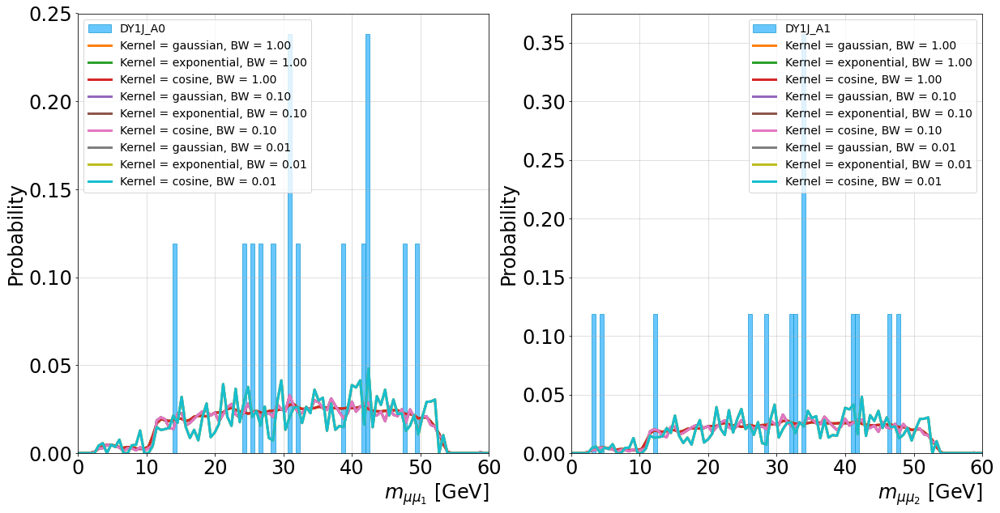

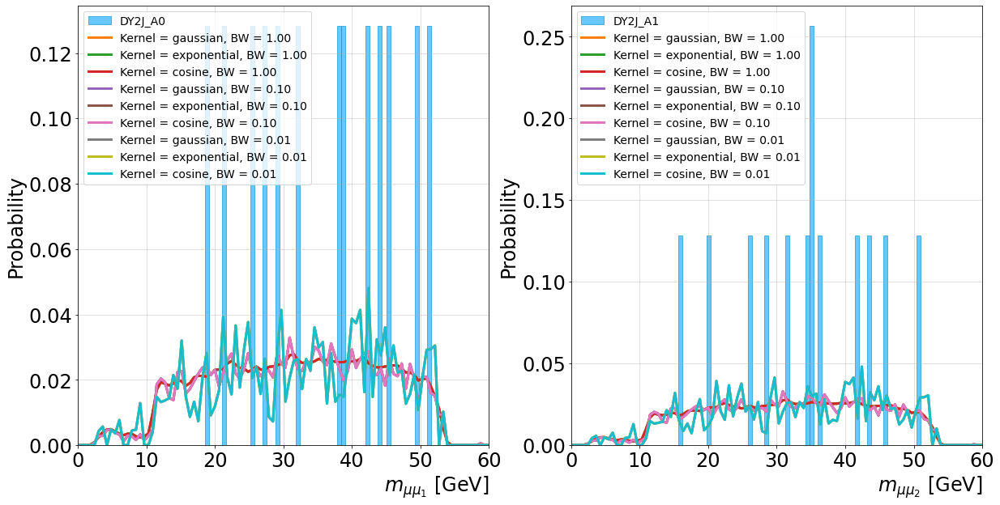

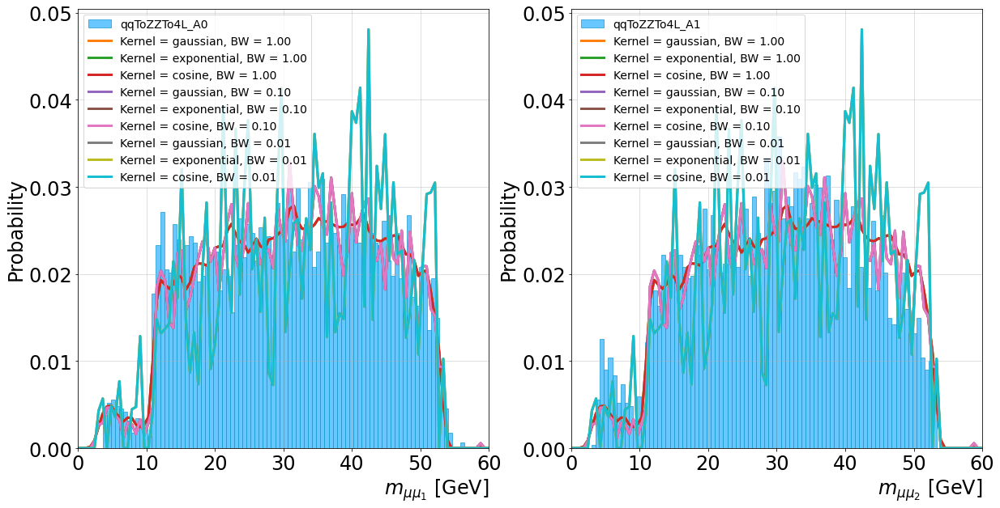

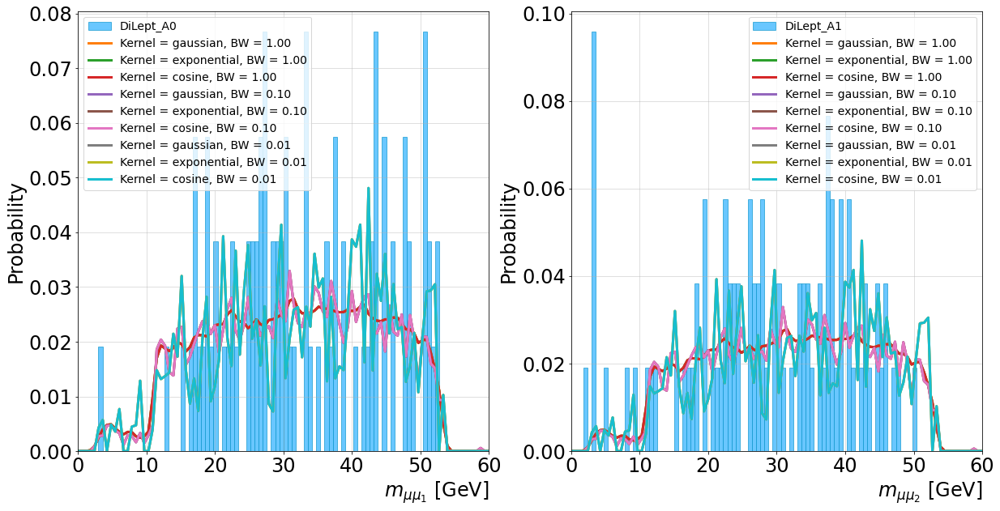

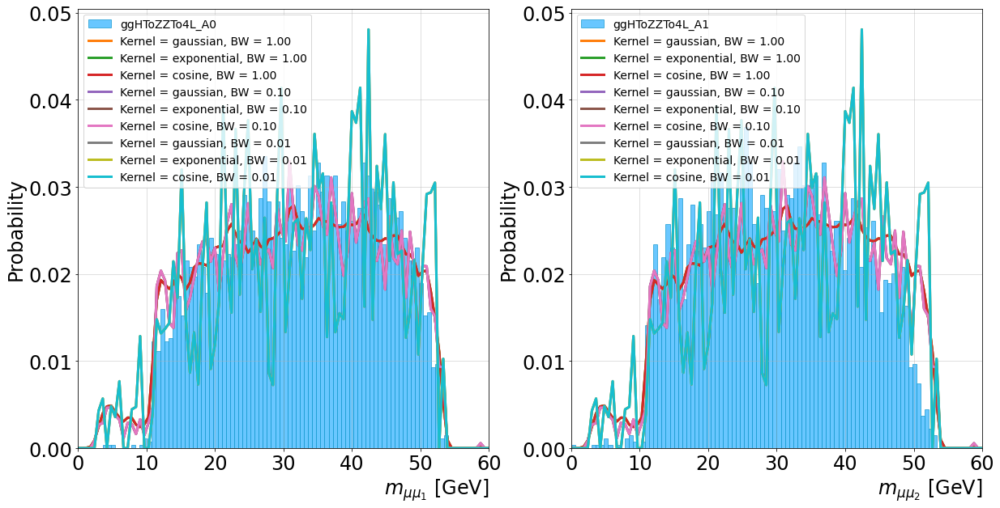

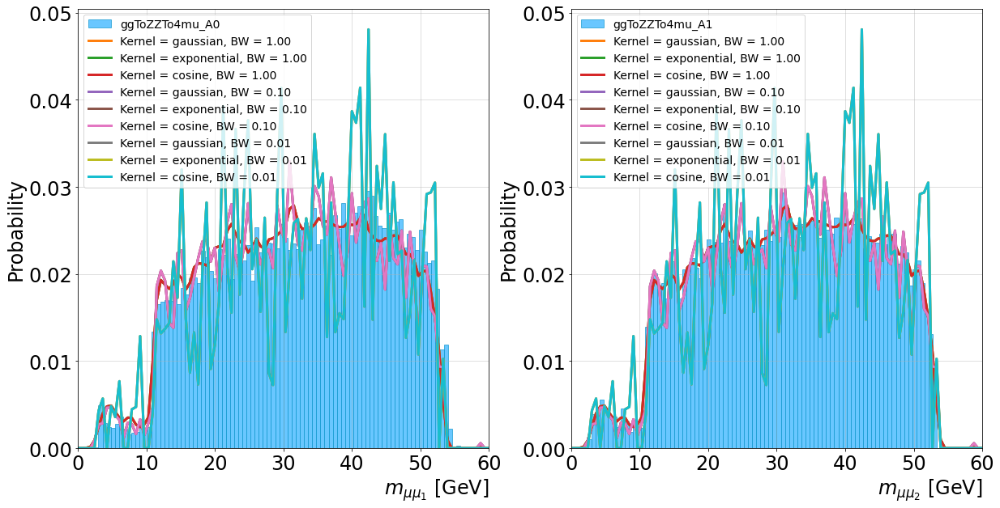

In [22]:
kde_plot = kde("bkg")
kde_plot.calc_kde_1D(invMass_bkg, kdeMethod = "sklearn", kernel_type = kernels, bw = bandwidths, verbose = verboseBool)
kde_plot.plot_kde_1D(suppress = False)
#kde_plot.total_bkg_1D(verbose = verboseBool)
#kde_plot.plot_kde_total_1D(suppress = suppress_plot)
#kde_plot.calc_kde_2D(verbose = verboseBool, custom_bin = bins_2D)
#kde_plot.plot_kde_2D(verbose = verboseBool, suppress = suppress_plot, plot_dir = "kde_bin_study")
#total_pdf_bkg = kde_plot.calc_total_bkg_2D(verbose = verboseBool)
#kde_plot.plot_total_kde_2D(verbose = verboseBool, suppress = suppress_plot)

# Baseline method

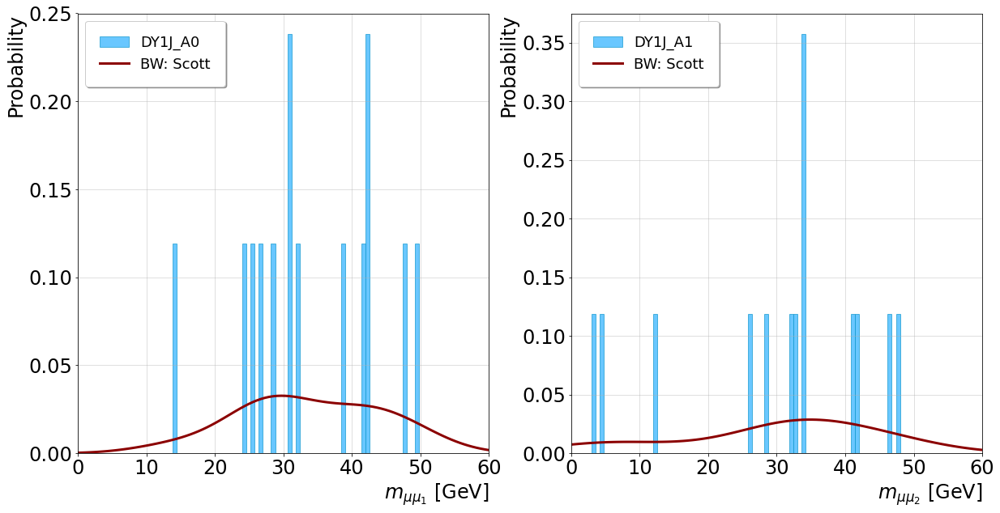

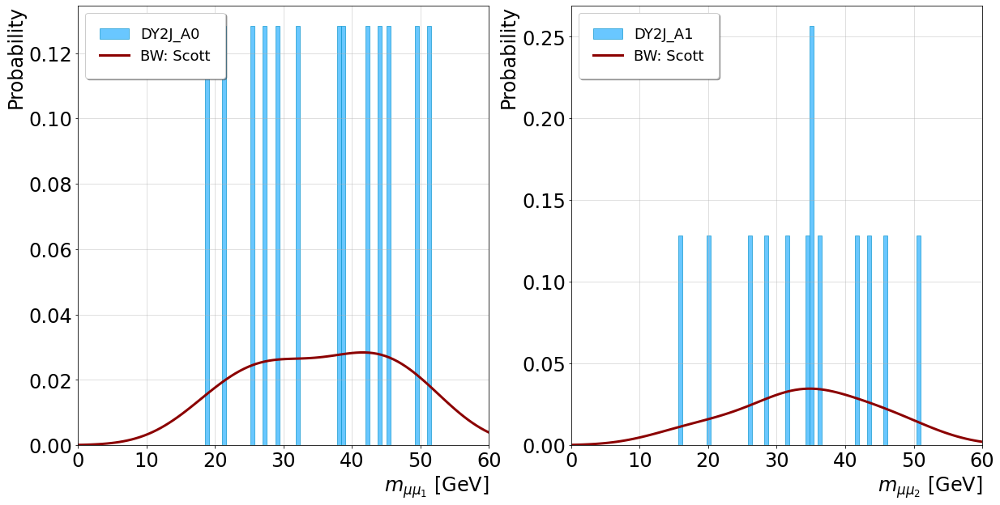

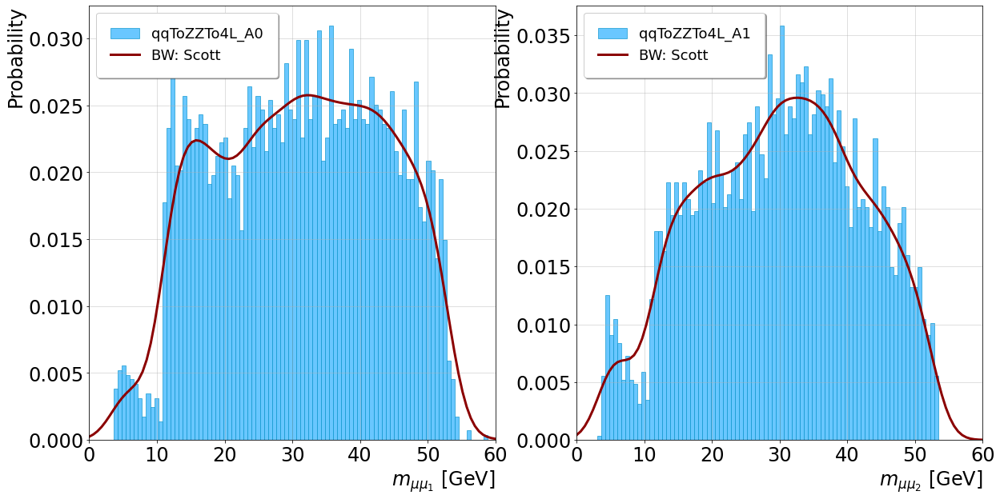

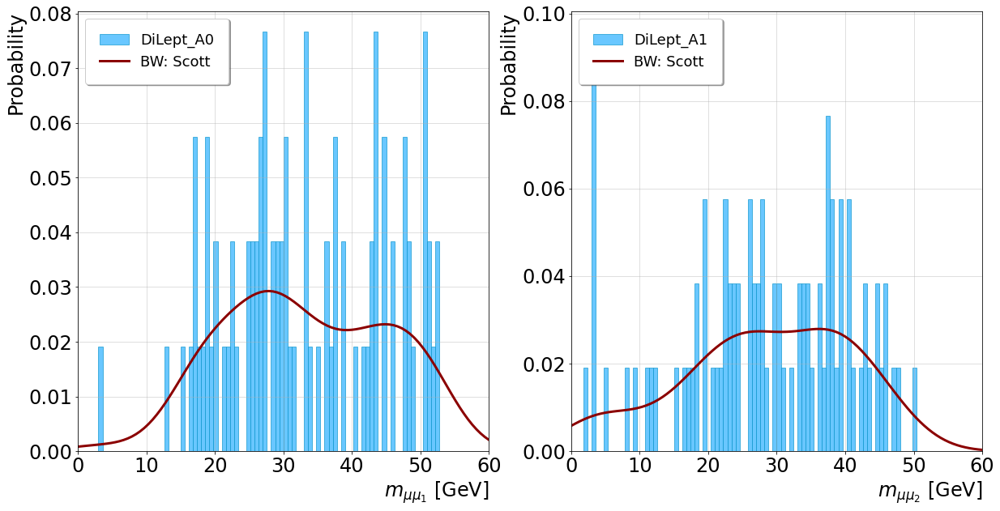

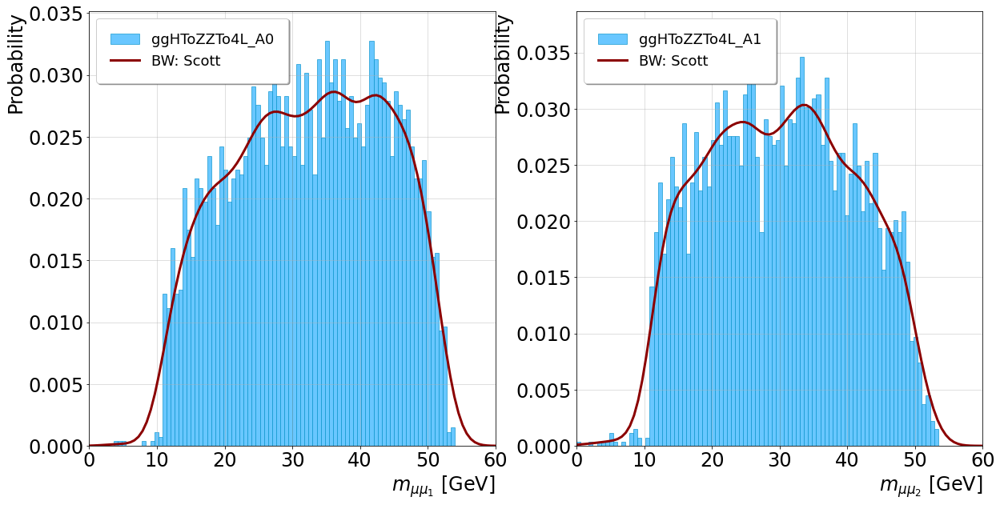

...

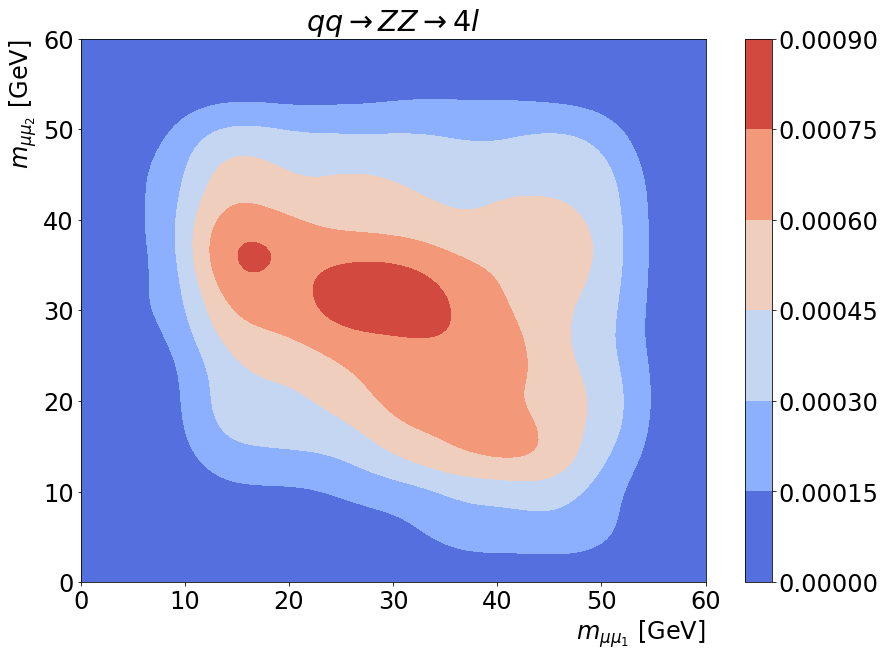

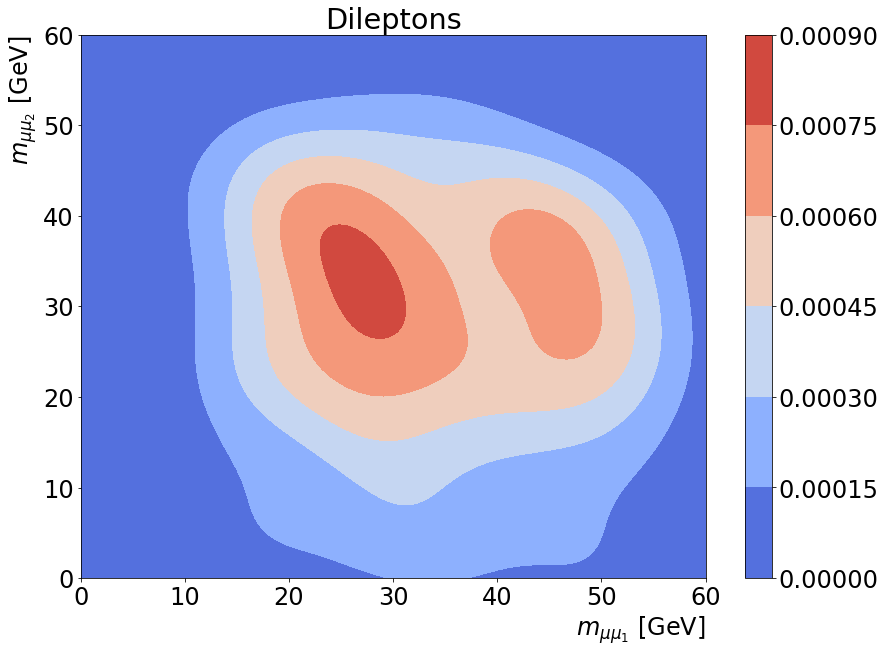

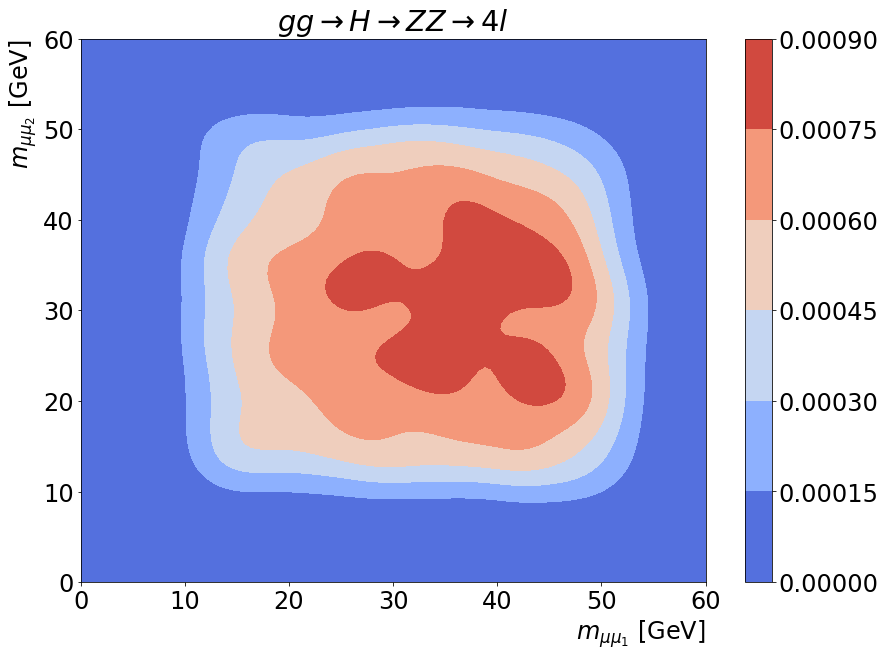

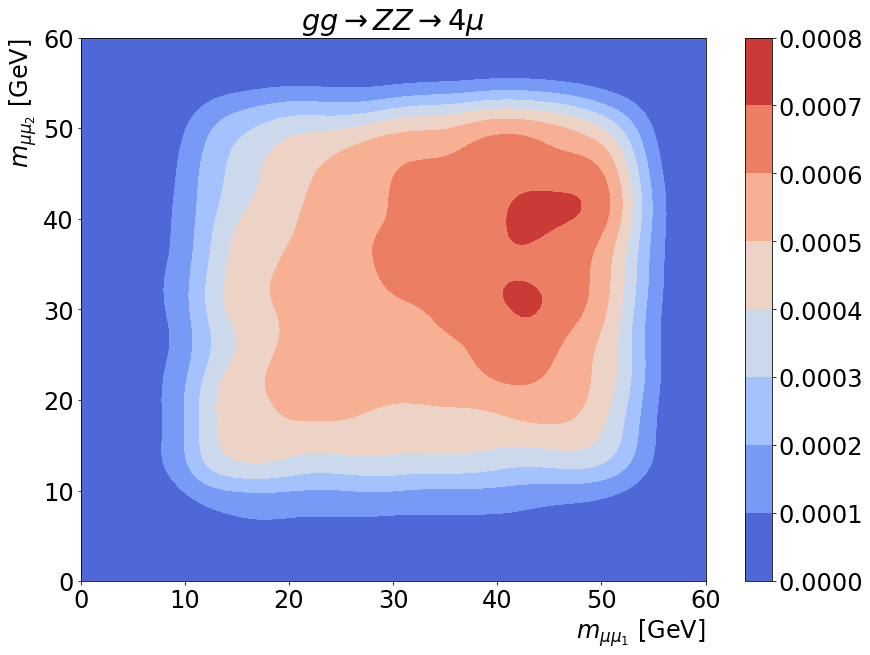

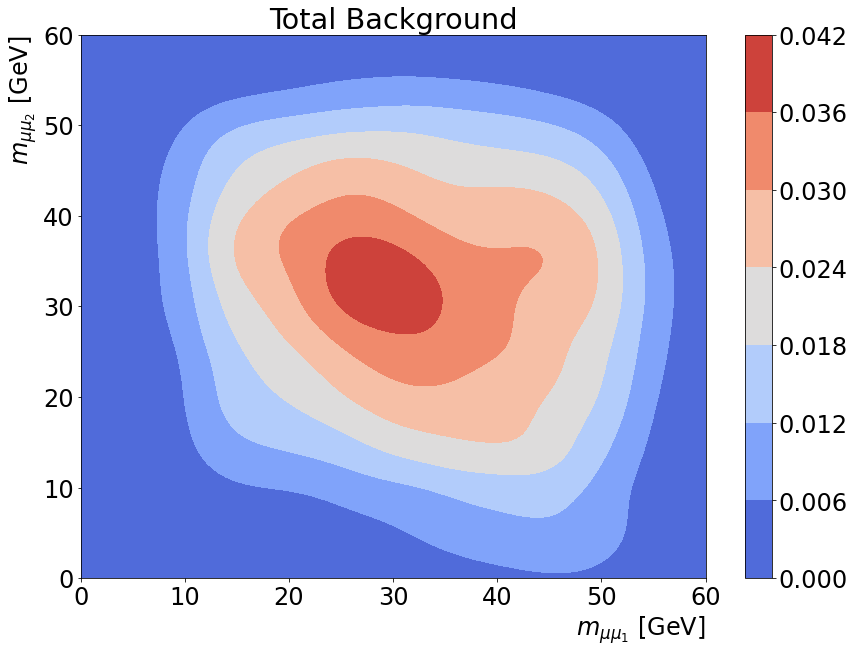

In [10]:
kde_plot = kde("bkg")
kde_plot.calc_kde_1D(invMass_bkg)
kde_plot.plot_kde_1D()
kde_plot.total_bkg_1D()
kde_plot.plot_kde_total_1D()
kde_plot.calc_kde_2D()
kde_plot.plot_kde_2D()
total_pdf_bkg = kde_plot.calc_total_bkg_2D()
kde_plot.plot_total_kde_2D()

# Test custom bin range functionality

In [24]:
verboseBool   = True
bins_2D       = 100j
suppress_plot = False

Calculating the 1D KDEs for the background dataset using the scipy method
Calculating the total 1D background PDFs
Calculating the 2D background PDFs for the background dataset

Plotting the 2D KDEs for the background dataset



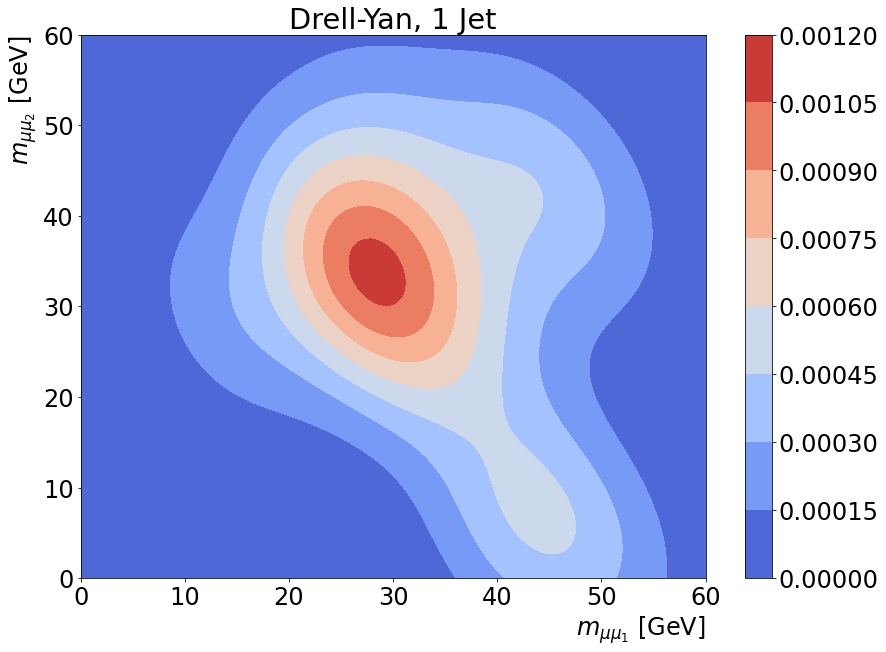

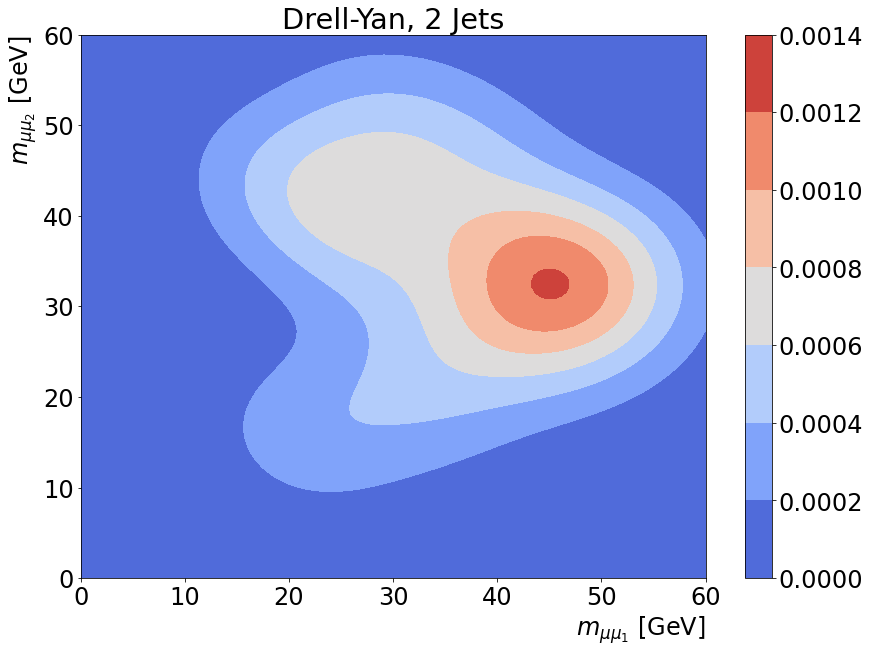

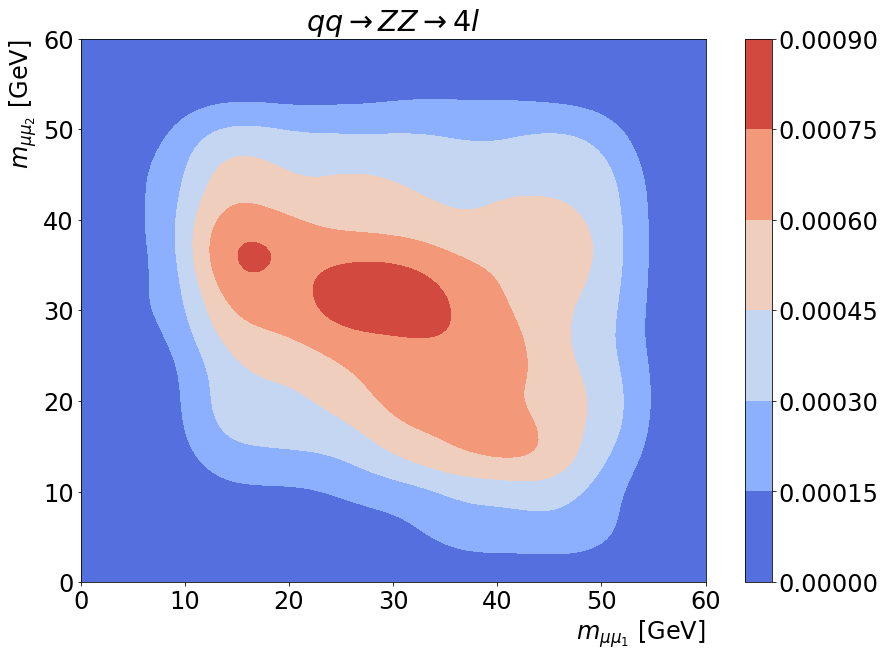

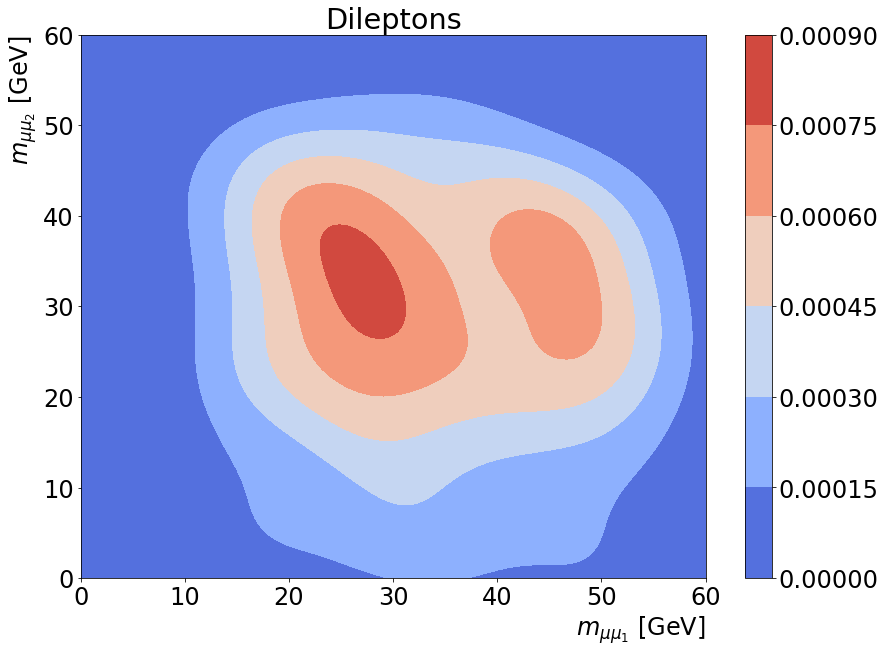

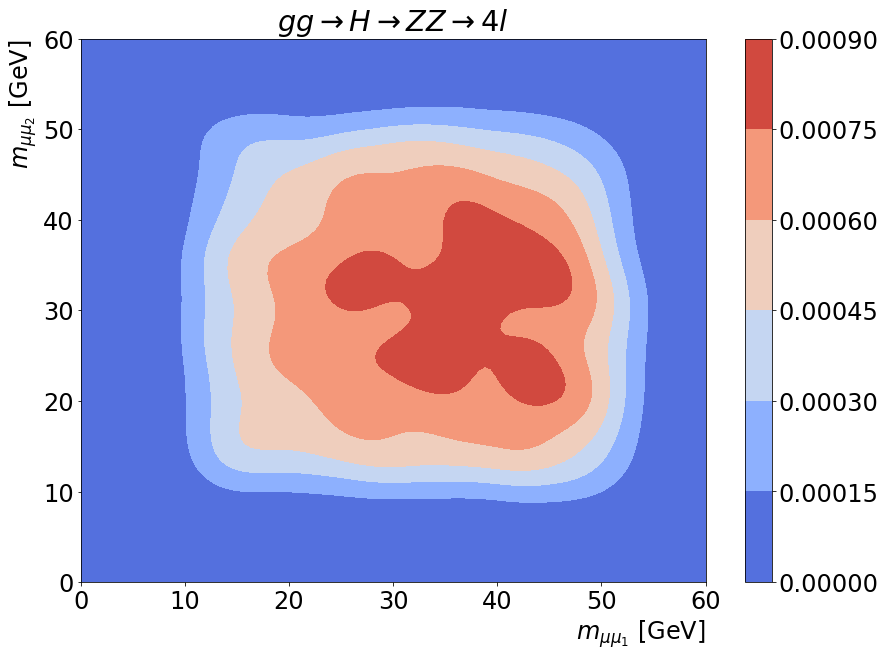

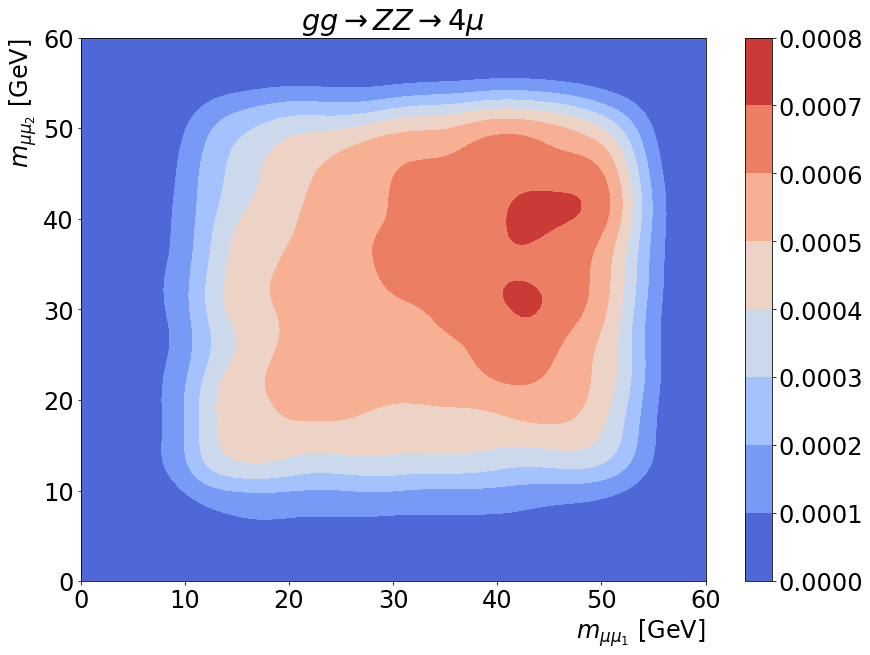

Calculating the total background PDF using method 0

Plotting the total 2D background KDE




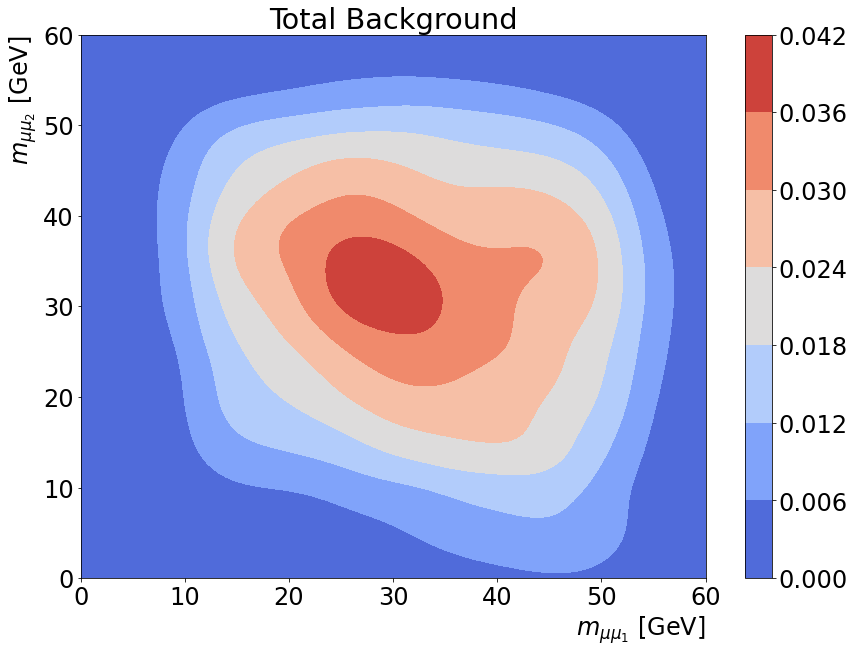

In [25]:
kde_plot = kde("bkg")
kde_plot.calc_kde_1D(invMass_bkg, verbose = verboseBool)
#kde_plot.plot_kde_1D(suppress = suppress_plot)
kde_plot.total_bkg_1D(verbose = verboseBool)
#kde_plot.plot_kde_total_1D(suppress = suppress_plot)
kde_plot.calc_kde_2D(verbose = verboseBool, custom_bin = bins_2D)
kde_plot.plot_kde_2D(verbose = verboseBool, suppress = suppress_plot, plot_dir = "kde_bin_study")
total_pdf_bkg = kde_plot.calc_total_bkg_2D(verbose = verboseBool)
kde_plot.plot_total_kde_2D(verbose = verboseBool, suppress = suppress_plot)

In [31]:
bins          = [20j, 60j, 100j, 250j, 500j, 750j, 1000j]
verboseBool   = True
suppress_plot = False

In [38]:
for number in bins:
    kde_plot = kde("bkg")
    kde_plot.calc_kde_1D(invMass_bkg, verbose = verboseBool)
    kde_plot.total_bkg_1D(verbose = verboseBool)
    kde_plot.calc_kde_2D(verbose = verboseBool, custom_bin = number)
    kde_plot.plot_kde_2D(verbose = verboseBool, suppress = suppress_plot, plot_dir = "kde_bin_study")
    total_pdf_bkg = kde_plot.calc_total_bkg_2D(verbose = verboseBool)
    kde_plot.plot_total_kde_2D(verbose = verboseBool, suppress = suppress_plot)

NameError: name 'bins' is not defined

In [30]:
kde_plot = kde("bkg")

In [31]:
kde_plot.calc_kde_1D(invMass_bkg, kdeMethod = "scipy")

In [32]:
kde_plot.plot_kde_1D()

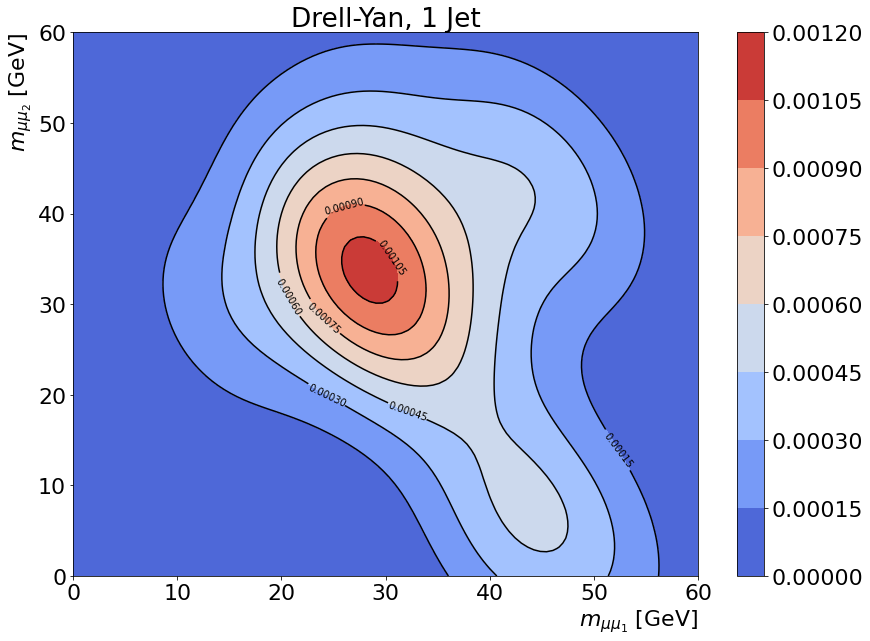

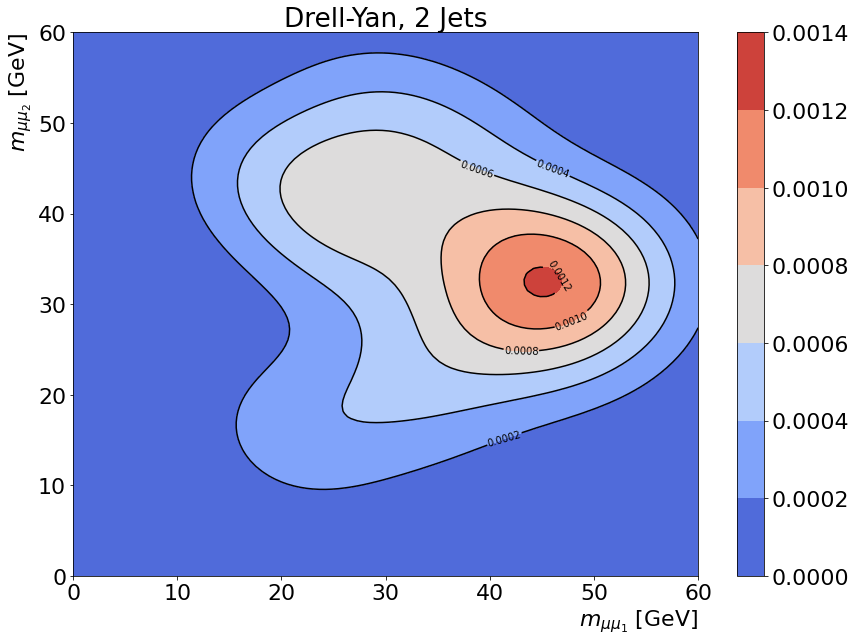

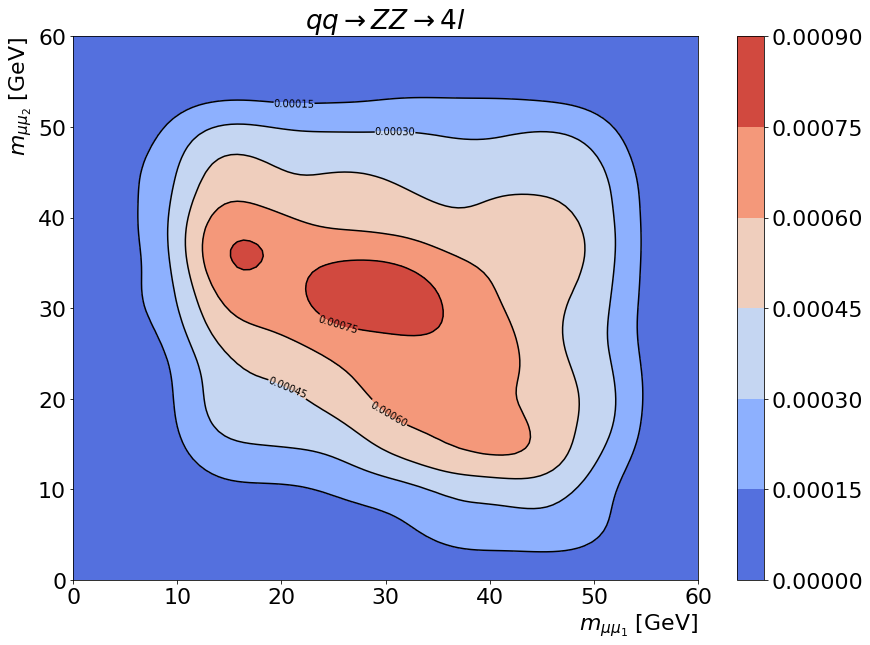

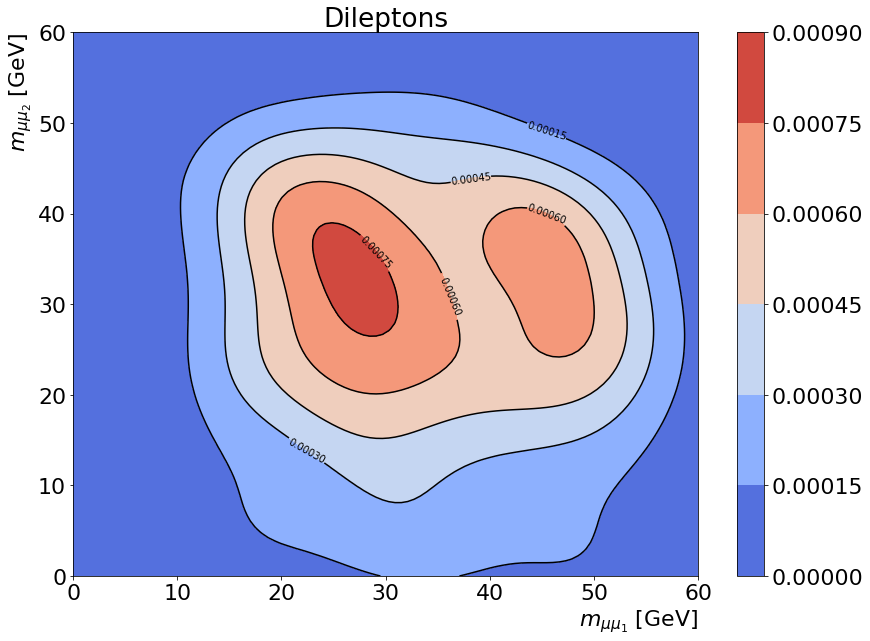

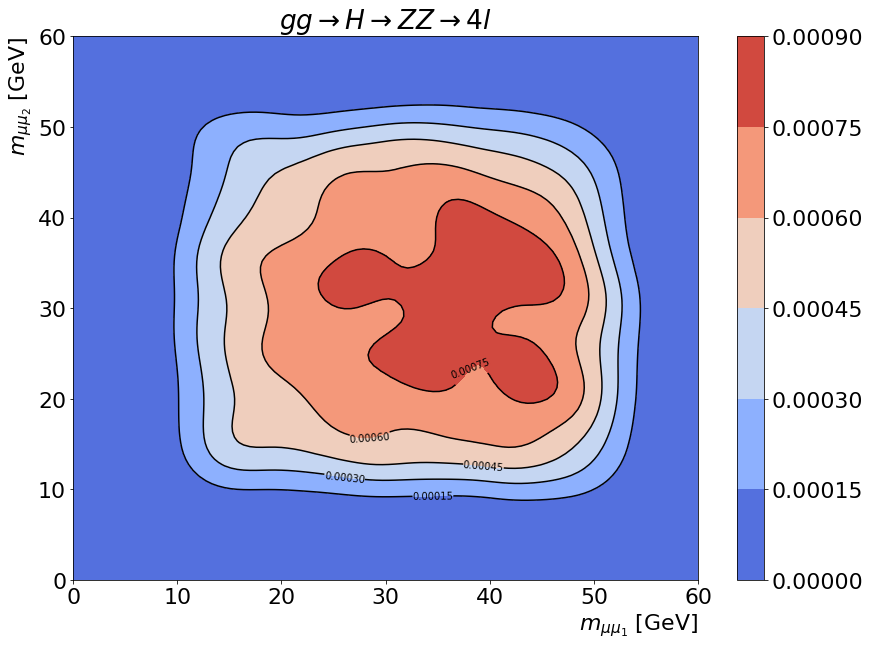

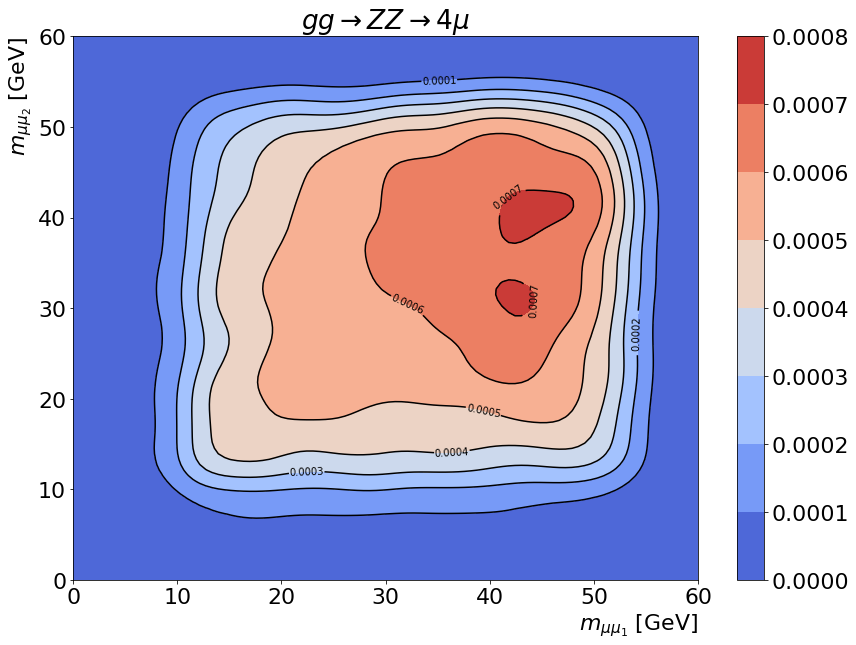

In [55]:
kde_plot.calc_kde_2D()
kde_plot.plot_kde_2D(style = "contour")

# Signal KDE

In [42]:
del invMass_sig["MZD_85_15"] # this file has zero events
del invMass_sig["MZD_95_25"] # this file only has two events

In [70]:
keys = list(invMass_sig.keys()) 
#keys_tmp = [key for key in keys if key != "MZD_85_15" and key != "MZD_95_25"]

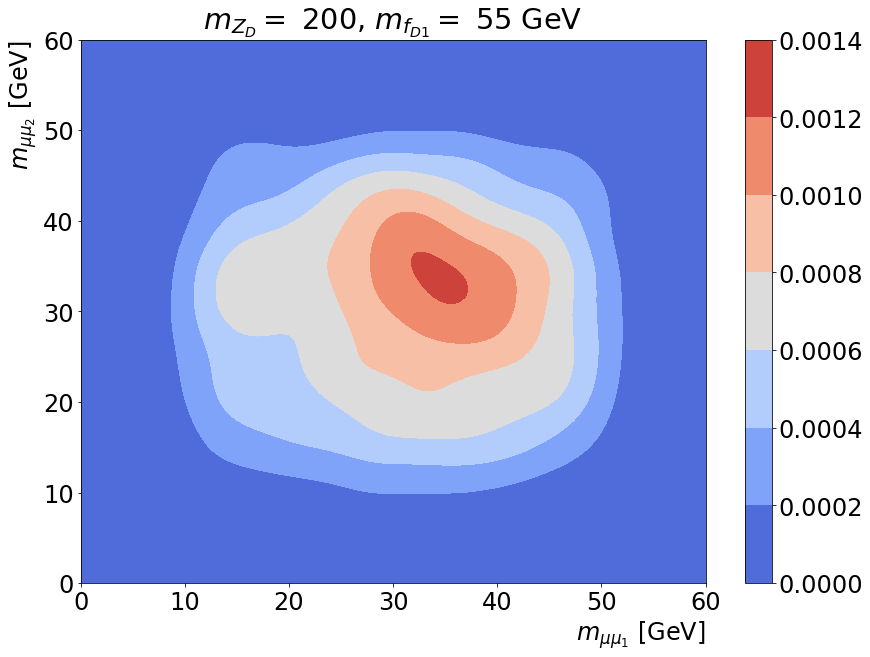

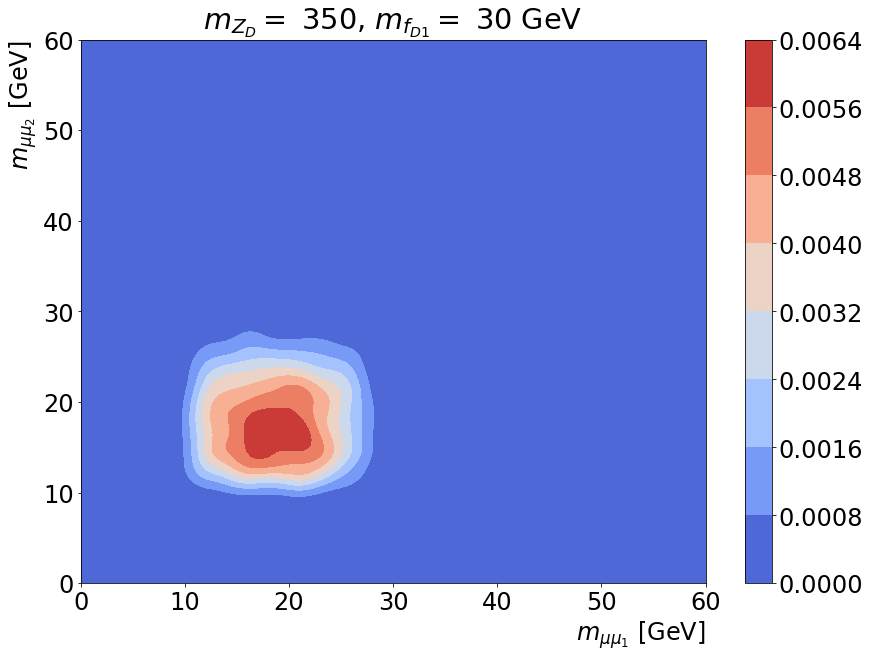

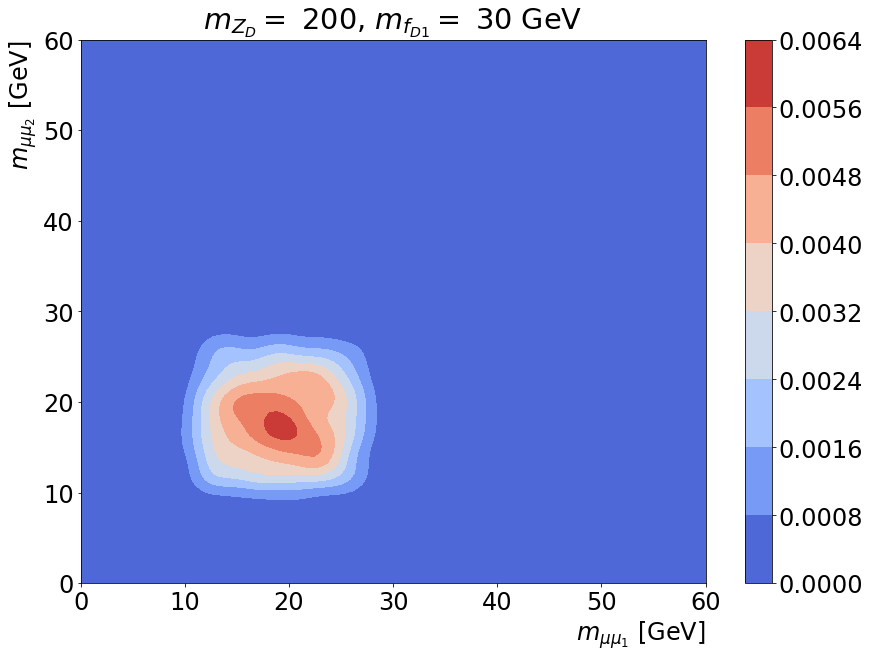

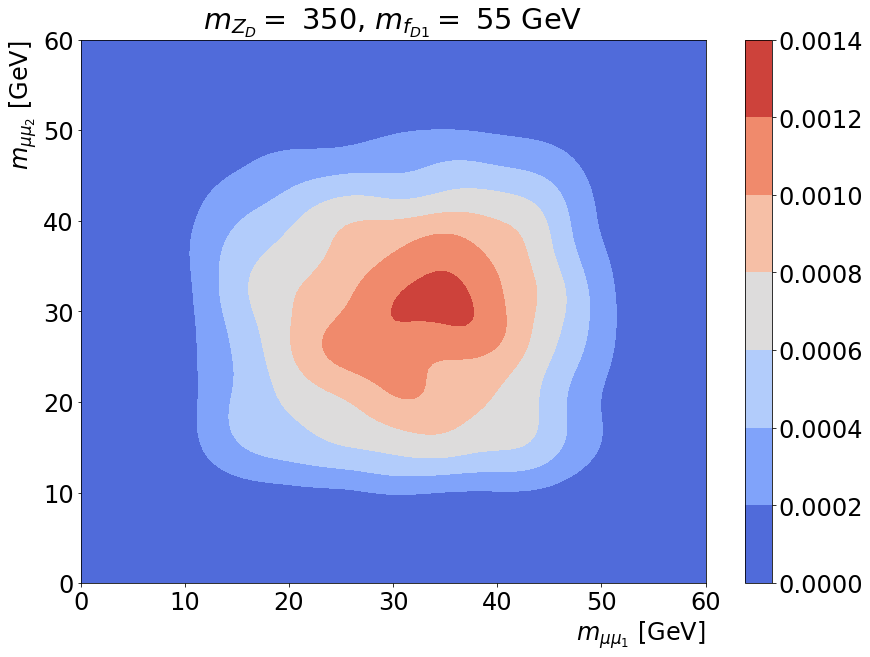

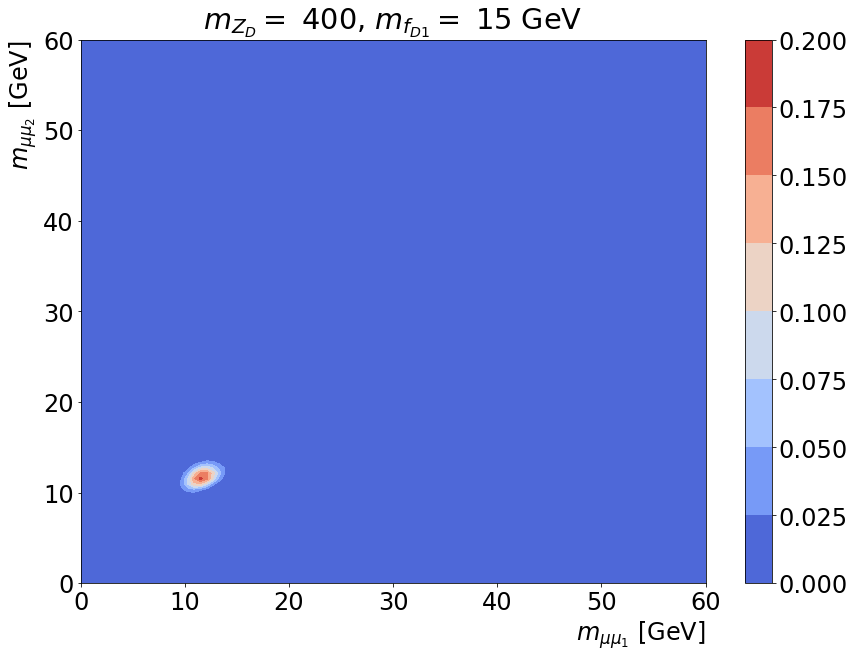

...

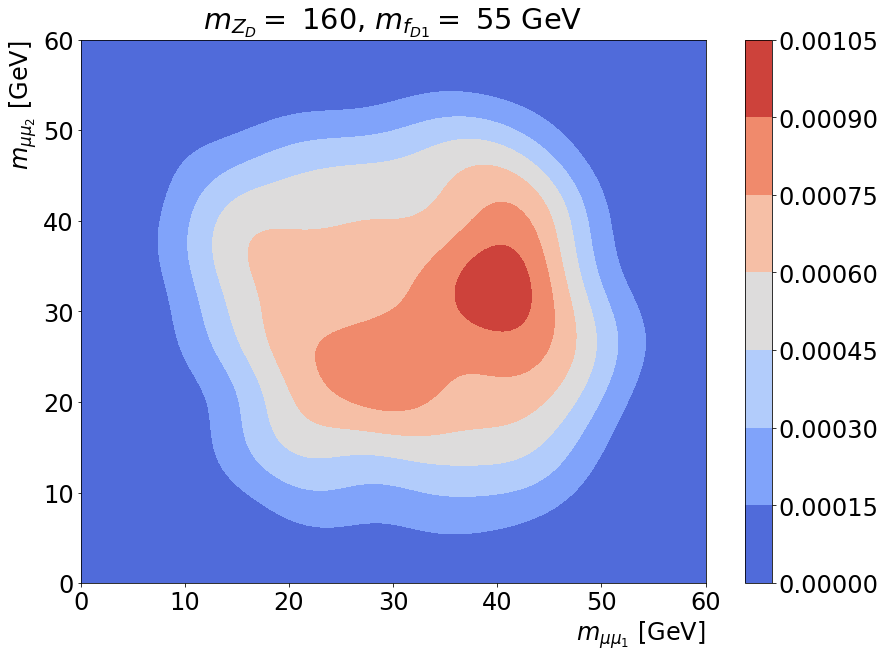

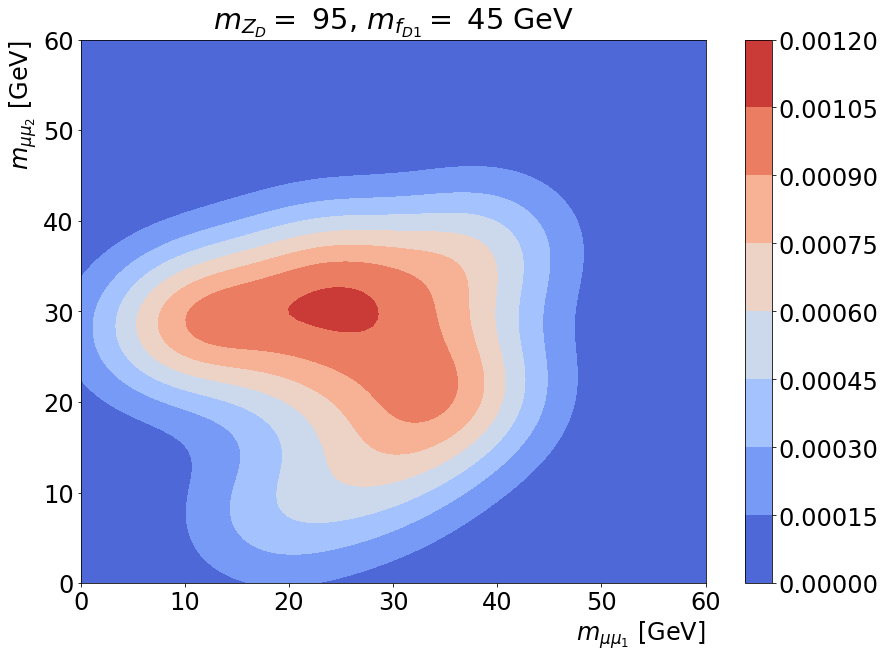

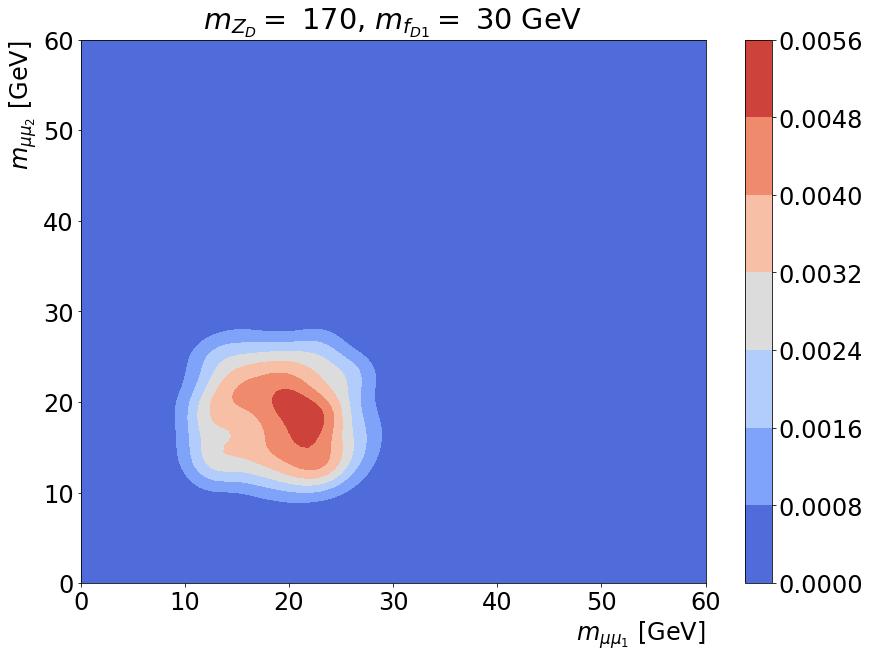

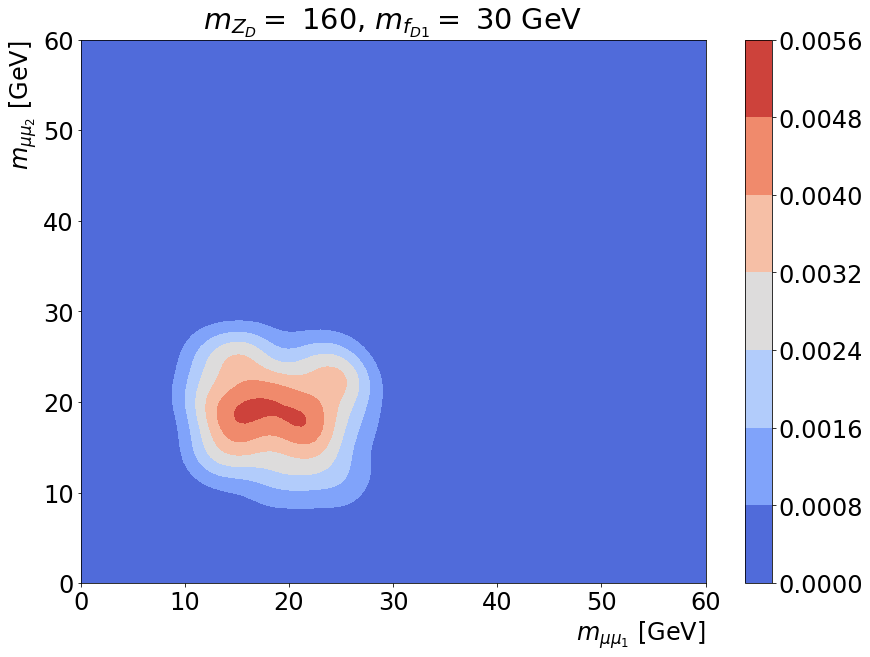

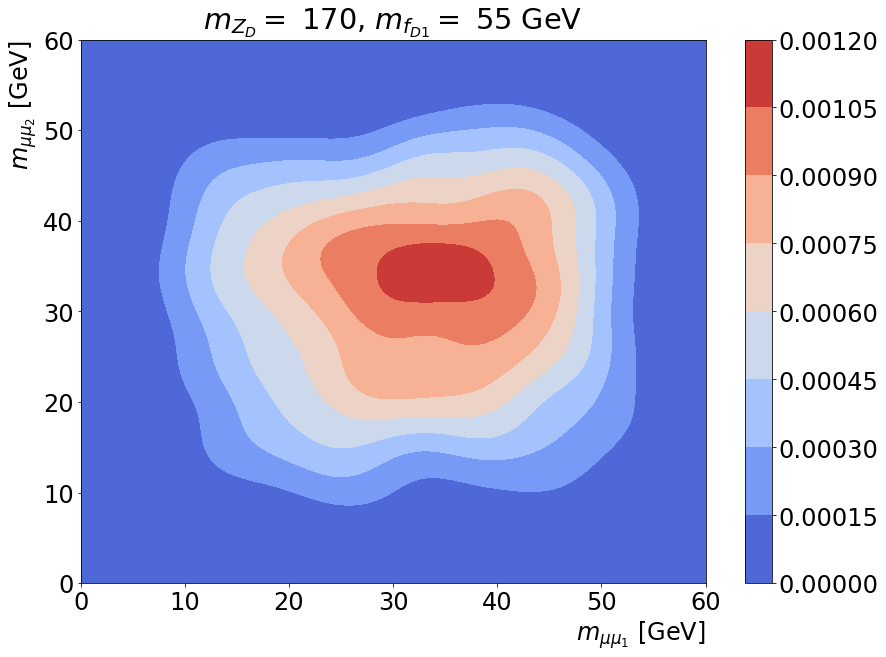

In [119]:
kde_sig = kde("sig", keys_tmp)
kde_sig.calc_kde_1D(invMass_sig)
#kde_sig.plot_kde_1D()
kde_sig.calc_kde_2D(custom_bin = 200j, plot_dir = "bin_study/bins_200")
kde_sig.plot_kde_2D()

/var/folders/4m/sr9gb66d1_z22jj2m1bqj6h00000gp/T/ipykernel_9666/1988415784.py:488: UserWarning: No contour levels were found within the data range.
  cset = ax.contour(xx, yy, divided_kde, [0, 0.2,  1, 3] , extend = 'max', colors = 'k')
/var/folders/4m/sr9gb66d1_z22jj2m1bqj6h00000gp/T/ipykernel_9666/1988415784.py:488: UserWarning: No contour levels were found within the data range.
  cset = ax.contour(xx, yy, divided_kde, [0, 0.2,  1, 3] , extend = 'max', colors = 'k')
/var/folders/4m/sr9gb66d1_z22jj2m1bqj6h00000gp/T/ipykernel_9666/1988415784.py:488: UserWarning: No contour levels were found within the data range.
  cset = ax.contour(xx, yy, divided_kde, [0, 0.2,  1, 3] , extend = 'max', colors = 'k')
/var/folders/4m/sr9gb66d1_z22jj2m1bqj6h00000gp/T/ipykernel_9666/1988415784.py:488: UserWarning: No contour levels were found within the data range.
  cset = ax.contour(xx, yy, divided_kde, [0, 0.2,  1, 3] , extend = 'max', colors = 'k')
/var/folders/4m/sr9gb66d1_z22jj2m1bqj6h00000gp/T/ipy

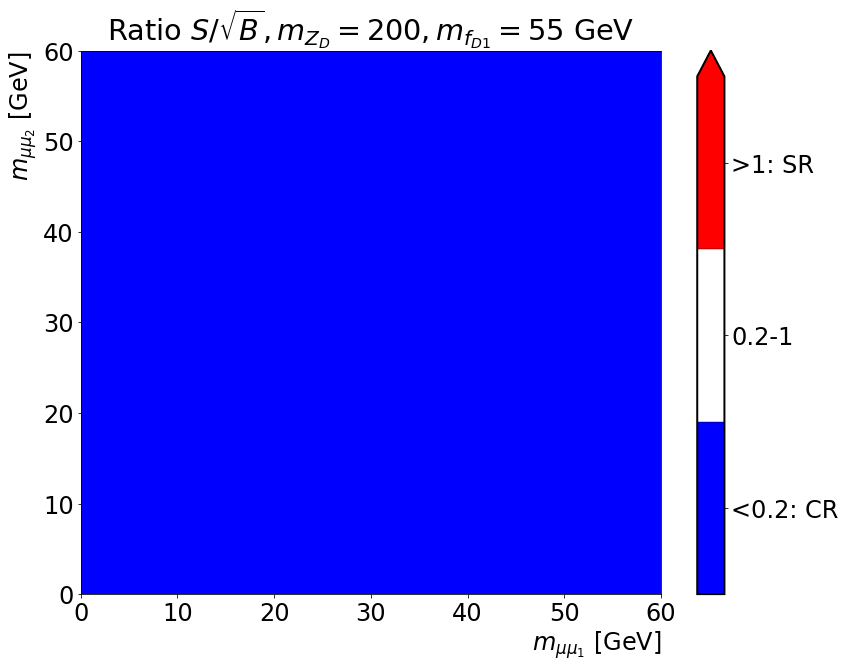

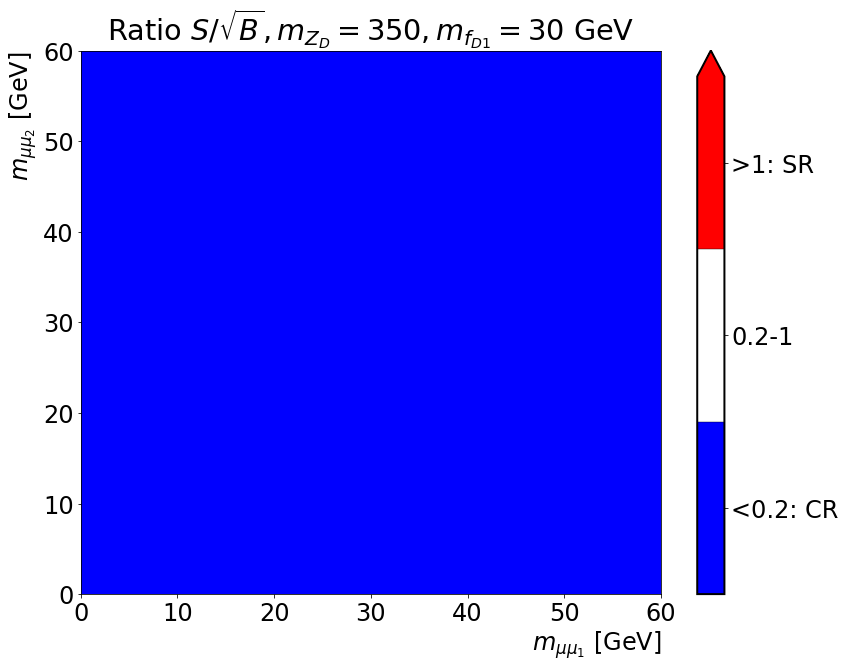

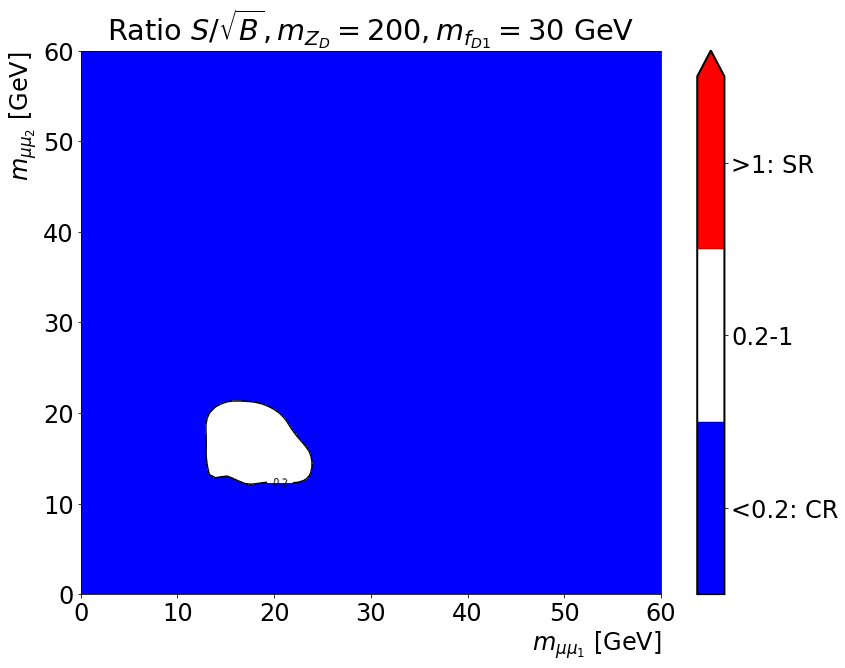

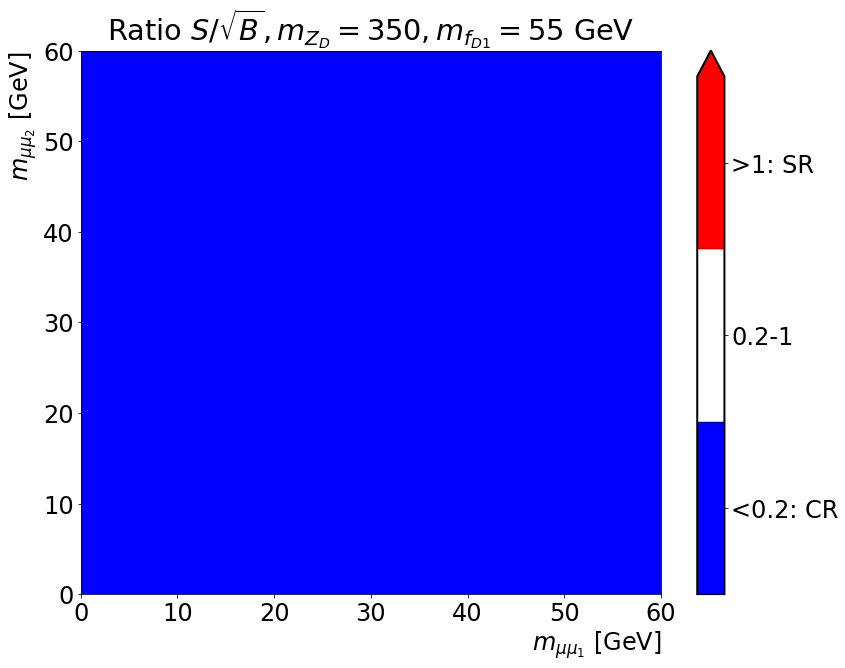

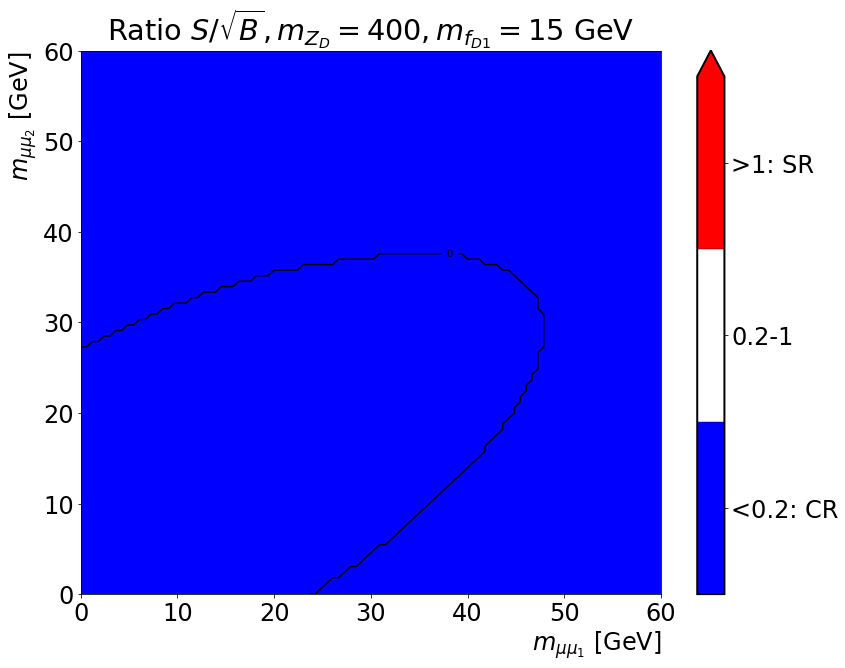

...

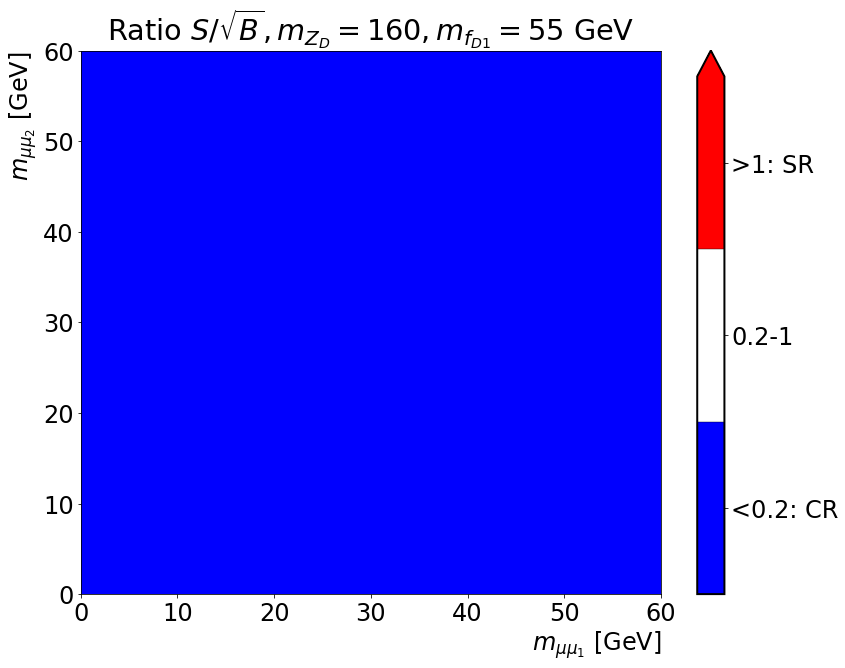

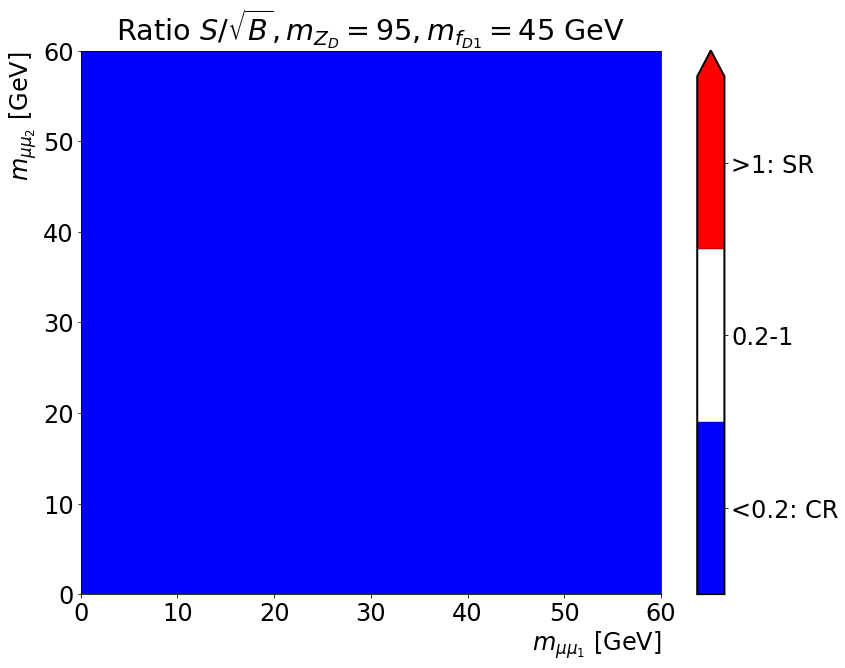

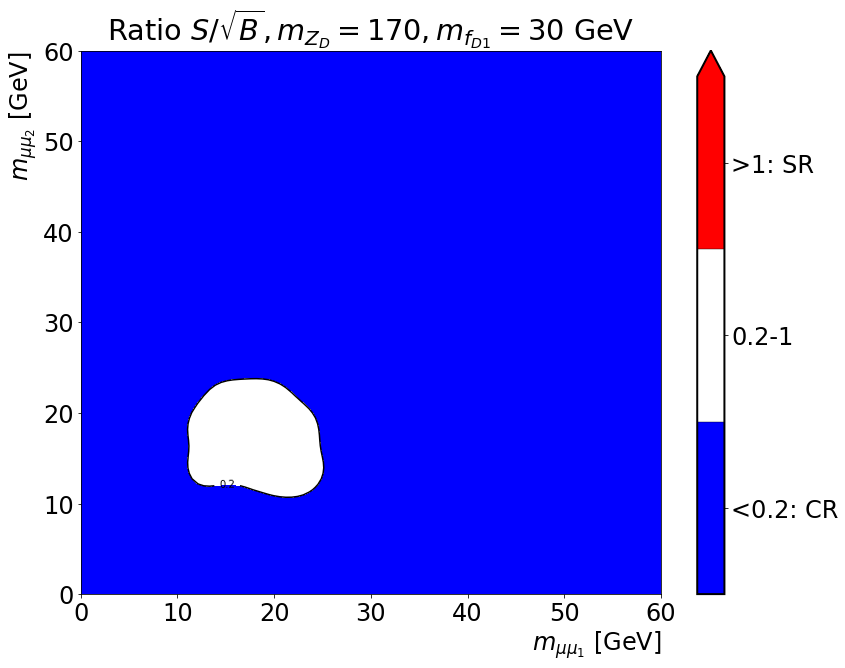

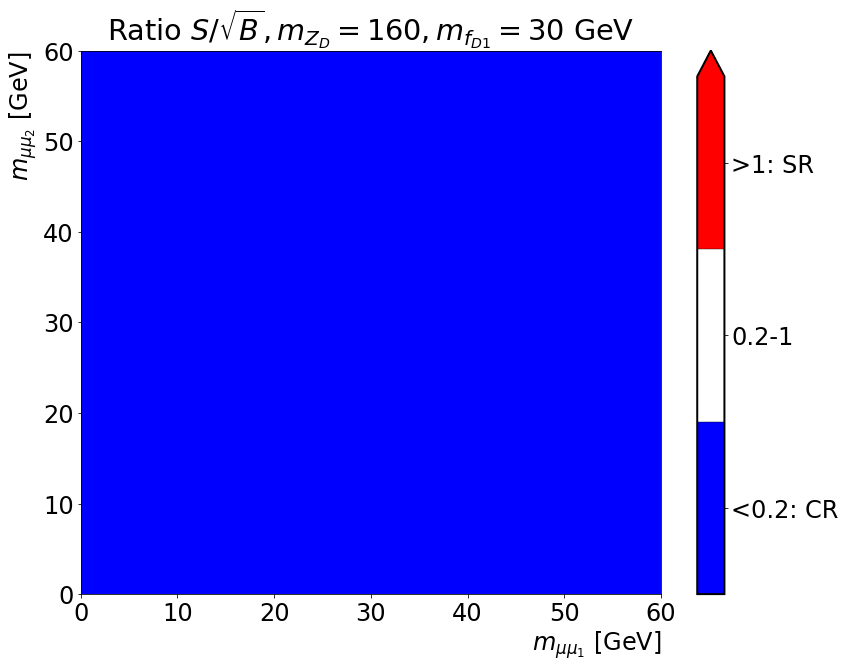

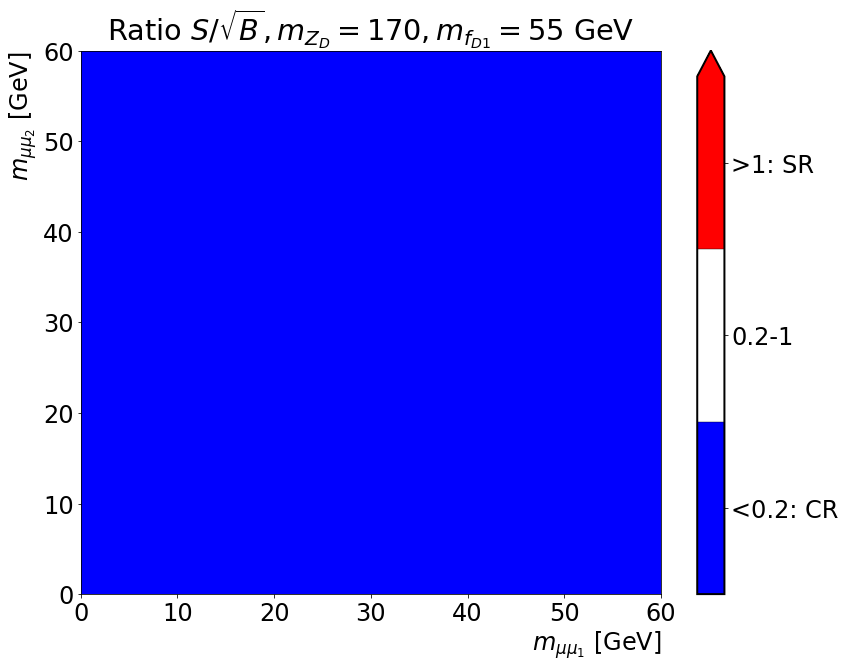

In [73]:
kde_sig.french_flag(total_pdf_bkg, contour = True)

# KDEpy
Trying KDE with the `python` module `KDEpy`.

In [23]:
from KDEpy import FFTKDE

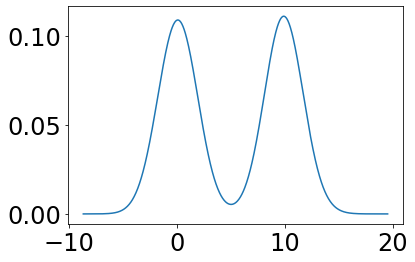

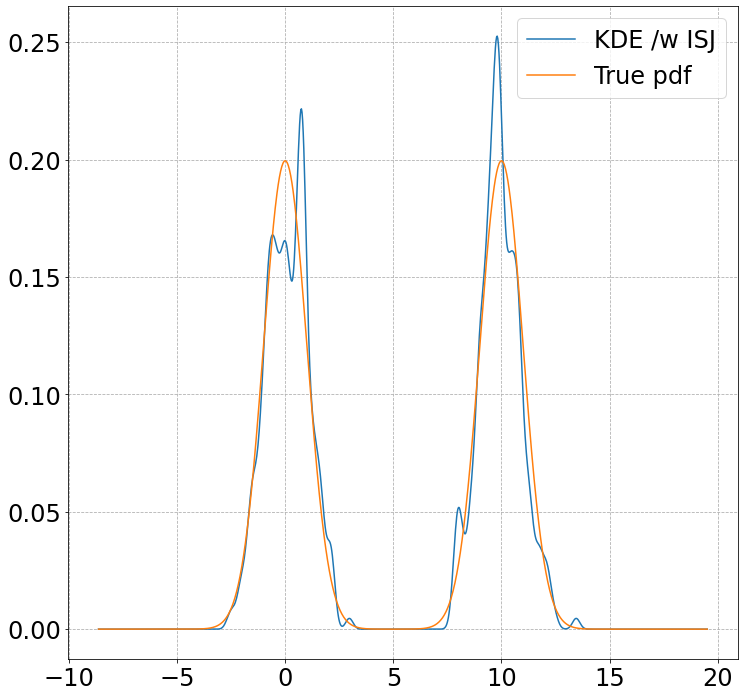

In [24]:
# Generate a distribution and some multimodal data
dist1 = norm(loc=0, scale=1)
dist2 = norm(loc=10, scale=1)
data = np.hstack([dist1.rvs(2**8), dist2.rvs(2**8)])

# Compute density estimates using 'silverman'
x, y = FFTKDE(kernel='gaussian', bw='silverman').fit(data).evaluate()
plt.plot(x, y, label='KDE /w silverman')

# Compute density estimates using 'ISJ' - Improved Sheather Jones
y = FFTKDE(kernel='gaussian', bw='ISJ').fit(data).evaluate(x)

fig, ax = plt.subplots(figsize = (12, 12))
ax.plot(x, y, label='KDE /w ISJ')

ax.plot(x, (dist1.pdf(x) + dist2.pdf(x))/2, label='True pdf')
ax.grid(True, ls='--', zorder=-15)
ax.legend()

In [38]:
data = np.random.randn(2**4, 2)
grid_points = 2**7  # Grid points in each dimension
N = 16

In [39]:
data.shape

(16, 2)

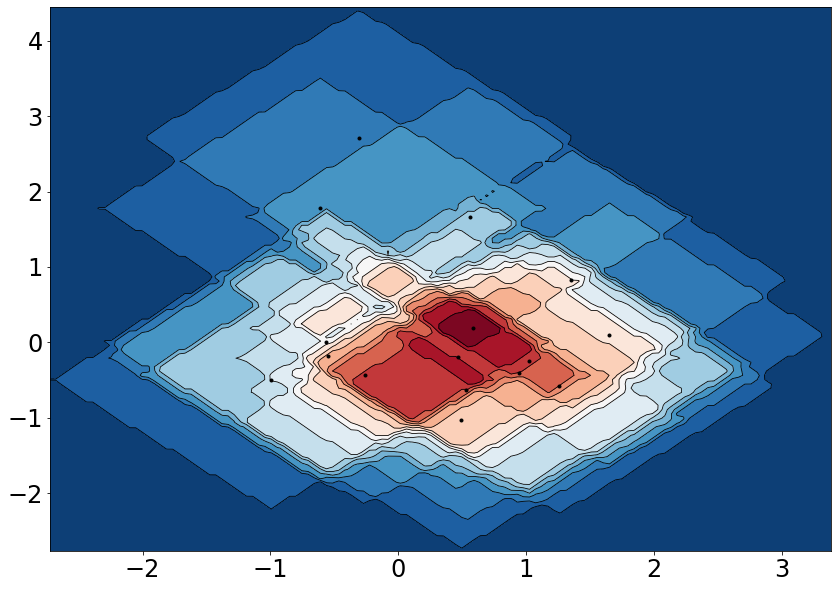

In [43]:
fig = plt.figure(figsize = (14, 10))
ax  = fig.gca()

# Compute the kernel density estimate
kde = FFTKDE(kernel = 'box', norm = 1)
grid, points = kde.fit(data).evaluate(grid_points)

# The grid is of shape (obs, dims), points are of shape (obs, 1)
x, y = np.unique(grid[:, 0]), np.unique(grid[:, 1])
z = points.reshape(grid_points, grid_points).T

# Plot the kernel density estimate
ax.contour(x, y, z, N, linewidths=0.8, colors='k')
ax.contourf(x, y, z, N, cmap="RdBu_r")
ax.plot(data[:, 0], data[:, 1], 'ok', ms=3)